In [1]:
import numpy as np
import pandas as pd
import datetime as dt
import pickle

from sklearn.preprocessing import OneHotEncoder, MultiLabelBinarizer
from scipy.stats import poisson
from sklearn.linear_model import LogisticRegression

import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns

# allow more data columns/rows to be shown than by default
pd.set_option('display.max_columns', 501)
pd.set_option('display.max_rows', 501)

In [2]:
# historical FPL data from https://github.com/vaastav/Fantasy-Premier-League
fpl_data = pd.read_csv('../../../../repos/Fantasy-Premier-League/data/cleaned_merged_seasons.csv', index_col=0,
                      dtype={'team_x':str})
fpl_data['kickoff_time'] = pd.to_datetime(fpl_data['kickoff_time'], yearfirst=True)
fpl_data = fpl_data.rename(columns={'season_x':'season', 'team_x':'team'})
fpl_data

,season,name,position,team,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
0,2016-17,Aaron Cresswell,DEF,NaN,0,0,0,0,0.0,454,10,0,0,0.0,0.0,2016-08-15 19:00:00+00:00,0,4,Chelsea,0,0,0,0,1,0,14023,1.0,2.0,0.0,0,0,0,0,55,False,0,1
1,2016-17,Aaron Lennon,MID,NaN,0,0,6,0,0.3,142,3,0,0,0.9,8.2,2016-08-13 14:00:00+00:00,15,17,Spurs,0,0,0,0,1,0,13918,1.0,1.0,0.0,1,0,0,0,60,True,0,1
2,2016-17,Aaron Ramsey,MID,NaN,0,0,5,0,4.9,16,8,3,0,3.0,2.2,2016-08-14 15:00:00+00:00,60,9,Liverpool,0,0,0,0,1,0,163170,4.0,3.0,23.0,2,0,0,0,80,True,0,1
3,2016-17,Abdoulaye Doucouré,MID,NaN,0,0,0,0,0.0,482,7,0,0,0.0,0.0,2016-08-13 14:00:00+00:00,0,13,Southampton,0,0,0,0,1,0,1051,1.0,1.0,0.0,0,0,0,0,50,False,0,1
4,2016-17,Adam Forshaw,MID,NaN,0,0,3,0,1.3,286,6,1,0,0.3,2.0,2016-08-13 14:00:00+00:00,69,14,Stoke,0,0,0,0,1,0,2723,1.0,1.0,0.0,1,0,0,0,45,True,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98397,2021-22,Wilfred Ndidi,MID,Leicester,0,0,0,0,0.0,216,377,0,0,0.0,0.0,2022-05-22 15:00:00+00:00,0,16,Southampton,0,0,0,0,38,0,70366,1.0,4.0,0.0,0,-202,22,224,48,True,0,38
98398,2021-22,Matt Ritchie,DEF,Newcastle,0,0,3,0,0.0,292,374,0,0,0.0,0.0,2022-05-22 15:00:00+00:00,1,5,Burnley,0,0,0,0,38,0,15999,2.0,1.0,0.0,1,143,396,253,49,False,0,38
98399,2021-22,Nathan Redmond,MID,Southampton,0,0,5,0,0.0,336,377,3,0,0.0,0.0,2022-05-22 15:00:00+00:00,82,9,Leicester,0,0,0,0,38,0,13856,1.0,4.0,0.0,2,455,683,228,59,False,0,38
98400,2021-22,Mathew Ryan,GK,Brighton,0,0,0,0,0.0,65,373,0,0,0.0,0.0,2022-05-22 15:00:00+00:00,0,19,West Ham,0,0,0,0,38,0,587,1.0,3.0,0.0,0,-2,0,2,45,True,0,38


In [3]:
# drop 2016-17 season as fbref data starts from 2017-28
fpl_data = fpl_data[fpl_data.season!='2016-17'].copy()
fpl_data

,season,name,position,team,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
8117,2017-18,Aaron Cresswell,DEF,NaN,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Man Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,False,0,1
8118,2017-18,Aaron Lennon,MID,NaN,0,0,0,0,0.0,153,5,0,0,0.0,0.0,2017-08-12 14:00:00+00:00,0,15,Stoke,0,0,0,0,1,0,4681,0.0,1.0,0.0,0,0,0,0,55,True,0,1
8119,2017-18,Aaron Mooy,MID,NaN,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,False,0,1
8120,2017-18,Aaron Ramsey,MID,NaN,0,0,16,0,11.2,18,1,0,1,6.7,29.6,2017-08-11 18:45:00+00:00,23,9,Leicester,0,0,0,0,1,0,33792,3.0,4.0,26.0,6,0,0,0,70,True,0,1
8121,2017-18,Abdoulaye Doucouré,MID,NaN,0,2,36,0,25.2,414,7,3,1,10.9,48.6,2017-08-12 11:30:00+00:00,90,10,Liverpool,0,0,0,0,1,0,1207,3.0,3.0,35.0,9,0,0,0,50,True,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98397,2021-22,Wilfred Ndidi,MID,Leicester,0,0,0,0,0.0,216,377,0,0,0.0,0.0,2022-05-22 15:00:00+00:00,0,16,Southampton,0,0,0,0,38,0,70366,1.0,4.0,0.0,0,-202,22,224,48,True,0,38
98398,2021-22,Matt Ritchie,DEF,Newcastle,0,0,3,0,0.0,292,374,0,0,0.0,0.0,2022-05-22 15:00:00+00:00,1,5,Burnley,0,0,0,0,38,0,15999,2.0,1.0,0.0,1,143,396,253,49,False,0,38
98399,2021-22,Nathan Redmond,MID,Southampton,0,0,5,0,0.0,336,377,3,0,0.0,0.0,2022-05-22 15:00:00+00:00,82,9,Leicester,0,0,0,0,38,0,13856,1.0,4.0,0.0,2,455,683,228,59,False,0,38
98400,2021-22,Mathew Ryan,GK,Brighton,0,0,0,0,0.0,65,373,0,0,0.0,0.0,2022-05-22 15:00:00+00:00,0,19,West Ham,0,0,0,0,38,0,587,1.0,3.0,0.0,0,-2,0,2,45,True,0,38


In [4]:
fpl_data.isnull().sum(axis=0)

season                   0
name                     0
position                 0
team                 41355
assists                  0
bonus                    0
bps                      0
clean_sheets             0
creativity               0
element                  0
fixture                  0
goals_conceded           0
goals_scored             0
ict_index                0
influence                0
kickoff_time             0
minutes                  0
opponent_team            0
opp_team_name            0
own_goals                0
penalties_missed         0
penalties_saved          0
red_cards                0
round                    0
saves                    0
selected                 0
team_a_score            49
team_h_score            49
threat                   0
total_points             0
transfers_balance        0
transfers_in             0
transfers_out            0
value                    0
was_home                 0
yellow_cards             0
GW                       0
d

In [5]:
# collect fbref data
fbref17_18 = pd.read_csv('../../../../football-data-analysis/data/player_data/from_fbref_fixtures/premier-league-17-18.csv',
                        index_col=0, header=[0,1])
fbref17_18['season'] = '2017-18'
fbref18_19 = pd.read_csv('../../../../football-data-analysis/data/player_data/from_fbref_fixtures/premier-league-18-19.csv',
                        index_col=0, header=[0,1])
fbref18_19['season'] = '2018-19'
fbref19_20 = pd.read_csv('../../../../football-data-analysis/data/player_data/from_fbref_fixtures/premier-league-19-20.csv',
                        index_col=0, header=[0,1])
fbref19_20['season'] = '2019-20'
fbref20_21 = pd.read_csv('../../../../football-data-analysis/data/player_data/from_fbref_fixtures/premier-league-20-21.csv',
                        index_col=0, header=[0,1])
fbref20_21['season'] = '2020-21'
fbref21_22 = pd.read_csv('../../../../football-data-analysis/data/player_data/from_fbref_fixtures/premier-league-21-22.csv',
                        index_col=0, header=[0,1])
fbref21_22['season'] = '2021-22'

In [6]:
# concat fbref data
fbref_data = pd.concat([fbref17_18,fbref18_19,fbref19_20,fbref20_21,fbref21_22], axis=0, ignore_index=True)
fbref_data

General                                     Performance  \
                    Player     #   Nation    Pos     Age   Min         Gls   
0      Alexandre Lacazette   9.0   fr FRA  FW,LW  26-075  90.0           1   
1            Danny Welbeck  23.0  eng ENG  AM,RW  26-258  74.0           1   
2             Theo Walcott  14.0  eng ENG     RW  28-148  16.0           0   
3               Mesut Özil  11.0   de GER     AM  28-300  90.0           0   
4             Granit Xhaka  29.0   ch SUI     DM  24-318  90.0           0   
...                    ...   ...      ...    ...     ...   ...         ...   
52420          Adam Masina  11.0   ma MAR     LB  28-140  13.0           0   
52421         Samir Santos  22.0   br BRA     CB  27-168  90.0           0   
52422   Christian Kabasele  27.0   be BEL     CB  31-087  90.0           0   
52423         Kiko Femenía  21.0   es ESP     RB  31-109  90.0           0   
52424      Daniel Bachmann  26.0   at AUT     GK  27-317  90.0           0   

                                                                  Expected  \
      Ast PK PKatt Sh SoT CrdY CrdR Touches Press  Tkl Int Blocks       xG   
0       0  0     0  3   2    0    0    36.0  18.0  1.0   0    1.0      0.3   
1       0  0     0  3   1    0    0    32.0  10.0  1.0   3    1.0      0.9   
2       0  0     0  0   0    0    0     3.0   1.0  0.0   1    0.0      0.0   
3       0  0     0  3   0    0    0    96.0   8.0  2.0   0    0.0      0.2   
4       2  0     0  4   1    0    0   115.0   8.0  1.0   2    1.0      0.1   
...    .. ..   ... ..  ..  ...  ...     ...   ...  ...  ..    ...      ...   
52420   1  0     0  0   0    0    0     6.0   1.0  1.0   0    0.0      0.0   
52421   0  0     0  0   0    0    0    30.0  12.0  1.0   1    1.0      0.0   
52422   0  0     0  0   0    0    0    21.0  12.0  3.0   1    4.0      0.0   
52423   0  0     0  1   1    0    0    58.0  13.0  3.0   3    3.0      0.0   
52424   0  0     0  0   0    0    0    32.0   0.0  0.0   0    0.0      0.0   

                  SCA      Passes                     Carries       Dribbles  \
      npxG   xA   SCA  GCA    Cmp    Att   Cmp%  Prog Carries  Prog     Succ   
0      0.3  0.3   7.0  2.0   21.0   25.0   84.0   1.0    18.0   1.0      1.0   
1      0.9  0.3   4.0  0.0   16.0   20.0   80.0   1.0    22.0   6.0      2.0   
2      0.0  0.0   1.0  0.0    1.0    2.0   50.0   0.0     2.0   1.0      0.0   
3      0.2  0.3   9.0  0.0   70.0   87.0   80.5   4.0    70.0   7.0      1.0   
4      0.1  0.3  12.0  2.0   86.0  104.0   82.7  15.0    71.0  10.0      1.0   
...    ...  ...   ...  ...    ...    ...    ...   ...     ...   ...      ...   
52420  0.0  0.2   1.0  1.0    5.0    5.0  100.0   0.0     3.0   0.0      0.0   
52421  0.0  0.0   0.0  0.0   15.0   24.0   62.5   0.0    12.0   1.0      0.0   
52422  0.0  0.0   0.0  0.0   10.0   14.0   71.4   0.0    12.0   0.0      0.0   
52423  0.0  0.0   0.0  0.0   30.0   47.0   63.8   4.0    33.0   4.0      0.0   
52424  0.0  0.0   0.0  0.0   17.0   29.0   58.6   0.0     7.0   0.0      0.0   

            General                          Total                        \
       Att    Squad HomeTeam        Opponent   Cmp    Att   Cmp% TotDist   
0      1.0  Arsenal     True  Leicester City  21.0   25.0   84.0   315.0   
1      2.0  Arsenal     True  Leicester City  16.0   20.0   80.0   200.0   
2      0.0  Arsenal     True  Leicester City   1.0    2.0   50.0    14.0   
3      3.0  Arsenal     True  Leicester City  70.0   87.0   80.5  1177.0   
4      1.0  Arsenal     True  Leicester City  86.0  104.0   82.7  2138.0   
...    ...      ...      ...             ...   ...    ...    ...     ...   
52420  0.0  Watford    False         Chelsea   5.0    5.0  100.0   109.0   
52421  0.0  Watford    False         Chelsea  15.0   24.0   62.5   306.0   
52422  0.0  Watford    False         Chelsea  10.0   14.0   71.4   236.0   
52423  2.0  Watford    False         Chelsea  30.0   47.0   63.8   498.0   
52424  0.0  Watford    False        

In [7]:
np.sort(fpl_data.opp_team_name.unique())

array(['Arsenal', 'Aston Villa', 'Bournemouth', 'Brentford', 'Brighton',
       'Burnley', 'Cardiff', 'Chelsea', 'Crystal Palace', 'Everton',
       'Fulham', 'Huddersfield', 'Leeds', 'Leicester', 'Liverpool',
       'Man City', 'Man Utd', 'Newcastle', 'Norwich', 'Sheffield Utd',
       'Southampton', 'Spurs', 'Stoke', 'Swansea', 'Watford', 'West Brom',
       'West Ham', 'Wolves'], dtype=object)

In [8]:
np.sort(fbref_data[('General','Opponent')].unique())

array(['Arsenal', 'Aston Villa', 'Bournemouth', 'Brentford', 'Brighton',
       'Burnley', 'Cardiff City', 'Chelsea', 'Crystal Palace', 'Everton',
       'Fulham', 'Huddersfield', 'Leeds United', 'Leicester City',
       'Liverpool', 'Manchester City', 'Manchester Utd', 'Newcastle Utd',
       'Norwich City', 'Sheffield Utd', 'Southampton', 'Stoke City',
       'Swansea City', 'Tottenham', 'Watford', 'West Brom', 'West Ham',
       'Wolves'], dtype=object)

In [9]:
my_dict = {'Cardiff':'Cardiff City', 'Leeds':'Leeds United', 'Leicester':'Leicester City', 
           'Man City':'Manchester City', 'Man Utd':'Manchester Utd', 
            'Newcastle':'Newcastle Utd', 'Norwich':'Norwich City', 'Stoke':'Stoke City', 'Swansea':'Swansea City', 
          'Spurs':'Tottenham'}

In [10]:
fpl_data['opp_team_name'] = fpl_data['opp_team_name'].map(my_dict).fillna(fpl_data['opp_team_name'])

In [11]:
np.sort(fpl_data.opp_team_name.unique())

array(['Arsenal', 'Aston Villa', 'Bournemouth', 'Brentford', 'Brighton',
       'Burnley', 'Cardiff City', 'Chelsea', 'Crystal Palace', 'Everton',
       'Fulham', 'Huddersfield', 'Leeds United', 'Leicester City',
       'Liverpool', 'Manchester City', 'Manchester Utd', 'Newcastle Utd',
       'Norwich City', 'Sheffield Utd', 'Southampton', 'Stoke City',
       'Swansea City', 'Tottenham', 'Watford', 'West Brom', 'West Ham',
       'Wolves'], dtype=object)

In [12]:
fpl_data.loc[fpl_data['team'].notnull(), 'team'] = fpl_data.loc[fpl_data['team'].notnull(), 'team'].map(my_dict).fillna(fpl_data.loc[fpl_data['team'].notnull(), 'team'])
fpl_data

,season,name,position,team,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
8117,2017-18,Aaron Cresswell,DEF,NaN,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Manchester Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,False,0,1
8118,2017-18,Aaron Lennon,MID,NaN,0,0,0,0,0.0,153,5,0,0,0.0,0.0,2017-08-12 14:00:00+00:00,0,15,Stoke City,0,0,0,0,1,0,4681,0.0,1.0,0.0,0,0,0,0,55,True,0,1
8119,2017-18,Aaron Mooy,MID,NaN,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,False,0,1
8120,2017-18,Aaron Ramsey,MID,NaN,0,0,16,0,11.2,18,1,0,1,6.7,29.6,2017-08-11 18:45:00+00:00,23,9,Leicester City,0,0,0,0,1,0,33792,3.0,4.0,26.0,6,0,0,0,70,True,0,1
8121,2017-18,Abdoulaye Doucouré,MID,NaN,0,2,36,0,25.2,414,7,3,1,10.9,48.6,2017-08-12 11:30:00+00:00,90,10,Liverpool,0,0,0,0,1,0,1207,3.0,3.0,35.0,9,0,0,0,50,True,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98397,2021-22,Wilfred Ndidi,MID,Leicester City,0,0,0,0,0.0,216,377,0,0,0.0,0.0,2022-05-22 15:00:00+00:00,0,16,Southampton,0,0,0,0,38,0,70366,1.0,4.0,0.0,0,-202,22,224,48,True,0,38
98398,2021-22,Matt Ritchie,DEF,Newcastle Utd,0,0,3,0,0.0,292,374,0,0,0.0,0.0,2022-05-22 15:00:00+00:00,1,5,Burnley,0,0,0,0,38,0,15999,2.0,1.0,0.0,1,143,396,253,49,False,0,38
98399,2021-22,Nathan Redmond,MID,Southampton,0,0,5,0,0.0,336,377,3,0,0.0,0.0,2022-05-22 15:00:00+00:00,82,9,Leicester City,0,0,0,0,38,0,13856,1.0,4.0,0.0,2,455,683,228,59,False,0,38
98400,2021-22,Mathew Ryan,GK,Brighton,0,0,0,0,0.0,65,373,0,0,0.0,0.0,2022-05-22 15:00:00+00:00,0,19,West Ham,0,0,0,0,38,0,587,1.0,3.0,0.0,0,-2,0,2,45,True,0,38


In [13]:
fbref_data.columns = [col[0]+'_'+col[1] for col in fbref_data.columns[:-1]] + ['season']
fbref_data

,General_Player,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,General_Squad,General_HomeTeam,General_Opponent,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,season
0,Alexandre Lacazette,9.0,fr FRA,"FW,LW",26-075,90.0,1,0,0,0,3,2,0,0,36.0,18.0,1.0,0,1.0,0.3,0.3,0.3,7.0,2.0,21.0,25.0,84.0,1.0,18.0,1.0,1.0,1.0,Arsenal,True,Leicester City,21.0,25.0,84.0,315.0,49.0,11.0,13.0,84.6,8.0,10.0,80.0,1.0,1.0,100.0,0,0.3,4.0,0.0,2.0,1.0,1.0,25.0,21.0,4.0,0.0,0.0,2.0,0.0,2,0.0,0.0,0.0,0.0,16.0,6.0,3.0,3.0,20.0,1.0,0.0,0.0,21.0,1.0,1.0,1.0,0.0,1.0,1,0.0,0.0,1.0,0.0,1.0,0.0,1.0,18.0,4.0,22.2,3.0,9.0,6.0,1.0,0.0,0.0,1.0,0,1.0,0.0,0.0,36.0,1.0,3.0,11.0,23.0,6.0,32.0,100.0,1.0,0.0,49.0,29.0,0.0,1.0,1.0,3.0,55.0,24.0,43.6,9.0,0,3,2,2,2,1,0.0,0.0,0,6.0,1.0,2.0,33.3,2017-18
1,Danny Welbeck,23.0,eng ENG,"AM,RW",26-258,74.0,1,0,0,0,3,1,0,0,32.0,10.0,1.0,3,1.0,0.9,0.9,0.3,4.0,0.0,16.0,20.0,80.0,1.0,22.0,6.0,2.0,2.0,Arsenal,True,Leicester City,16.0,20.0,80.0,200.0,30.0,13.0,14.0,92.9,3.0,4.0,75.0,0.0,0.0,NaN,0,0.3,2.0,1.0,1.0,0.0,1.0,20.0,20.0,0.0,0.0,1.0,2.0,0.0,0,0.0,0.0,0.0,0.0,17.0,1.0,2.0,1.0,18.0,1.0,0.0,0.0,16.0,0.0,0.0,1.0,1.0,1.0,1,1.0,0.0,0.0,0.0,0.0,NaN,0.0,10.0,6.0,60.0,3.0,3.0,4.0,1.0,0.0,0.0,1.0,3,4.0,1.0,0.0,32.0,1.0,7.0,7.0,18.0,8.0,32.0,100.0,2.0,0.0,150.0,75.0,0.0,2.0,1.0,3.0,34.0,22.0,64.7,6.0,0,1,1,1,0,1,0.0,0.0,0,4.0,1.0,1.0,50.0,2017-18
2,Theo Walcott,14.0,eng ENG,RW,28-148,16.0,0,0,0,0,0,0,0,0,3.0,1.0,0.0,1,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2.0,50.0,0.0,2.0,1.0,0.0,0.0,Arsenal,True,Leicester City,1.0,2.0,50.0,14.0,0.0,1.0,1.0,100.0,0.0,1.0,0.0,0.0,0.0,NaN,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,1.0,0.0,0.0,3.0,0.0,1.0,0.0,2.0,0.0,3.0,NaN,0.0,0.0,19.0,16.0,0.0,0.0,0.0,0.0,5.0,2.0,40.0,0.0,0,0,0,1,1,0,0.0,0.0,0,0.0,0.0,0.0,NaN,2017-18
3,Mesut Özil,11.0,de GER,AM,28-300,90.0,0,0,0,0,3,0,0,0,96.0,8.0,2.0,0,0.0,0.2,0.2,0.3,9.0,0.0,70.0,87.0,80.5,4.0,70.0,7.0,1.0,3.0,Arsenal,True,Leicester City,70.0,87.0,80.5,1177.0,183.0,39.0,44.0,88.6,21.0,24.0,87.5,8.0,13.0,61.5,0,0.3,5.0,6.0,3.0,0.0,4.0,87.0,84.0,3.0,2.0,0.0,9.0,4.0,3,1.0

In [14]:
fbref_data = fbref_data.rename(columns={'General_Player':'name', 'General_Opponent':'opp_team_name', 'General_HomeTeam':'was_home', 'General_Squad':'team'})
fbref_data

,name,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,was_home,opp_team_name,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,season
0,Alexandre Lacazette,9.0,fr FRA,"FW,LW",26-075,90.0,1,0,0,0,3,2,0,0,36.0,18.0,1.0,0,1.0,0.3,0.3,0.3,7.0,2.0,21.0,25.0,84.0,1.0,18.0,1.0,1.0,1.0,Arsenal,True,Leicester City,21.0,25.0,84.0,315.0,49.0,11.0,13.0,84.6,8.0,10.0,80.0,1.0,1.0,100.0,0,0.3,4.0,0.0,2.0,1.0,1.0,25.0,21.0,4.0,0.0,0.0,2.0,0.0,2,0.0,0.0,0.0,0.0,16.0,6.0,3.0,3.0,20.0,1.0,0.0,0.0,21.0,1.0,1.0,1.0,0.0,1.0,1,0.0,0.0,1.0,0.0,1.0,0.0,1.0,18.0,4.0,22.2,3.0,9.0,6.0,1.0,0.0,0.0,1.0,0,1.0,0.0,0.0,36.0,1.0,3.0,11.0,23.0,6.0,32.0,100.0,1.0,0.0,49.0,29.0,0.0,1.0,1.0,3.0,55.0,24.0,43.6,9.0,0,3,2,2,2,1,0.0,0.0,0,6.0,1.0,2.0,33.3,2017-18
1,Danny Welbeck,23.0,eng ENG,"AM,RW",26-258,74.0,1,0,0,0,3,1,0,0,32.0,10.0,1.0,3,1.0,0.9,0.9,0.3,4.0,0.0,16.0,20.0,80.0,1.0,22.0,6.0,2.0,2.0,Arsenal,True,Leicester City,16.0,20.0,80.0,200.0,30.0,13.0,14.0,92.9,3.0,4.0,75.0,0.0,0.0,NaN,0,0.3,2.0,1.0,1.0,0.0,1.0,20.0,20.0,0.0,0.0,1.0,2.0,0.0,0,0.0,0.0,0.0,0.0,17.0,1.0,2.0,1.0,18.0,1.0,0.0,0.0,16.0,0.0,0.0,1.0,1.0,1.0,1,1.0,0.0,0.0,0.0,0.0,NaN,0.0,10.0,6.0,60.0,3.0,3.0,4.0,1.0,0.0,0.0,1.0,3,4.0,1.0,0.0,32.0,1.0,7.0,7.0,18.0,8.0,32.0,100.0,2.0,0.0,150.0,75.0,0.0,2.0,1.0,3.0,34.0,22.0,64.7,6.0,0,1,1,1,0,1,0.0,0.0,0,4.0,1.0,1.0,50.0,2017-18
2,Theo Walcott,14.0,eng ENG,RW,28-148,16.0,0,0,0,0,0,0,0,0,3.0,1.0,0.0,1,0.0,0.0,0.0,0.0,1.0,0.0,1.0,2.0,50.0,0.0,2.0,1.0,0.0,0.0,Arsenal,True,Leicester City,1.0,2.0,50.0,14.0,0.0,1.0,1.0,100.0,0.0,1.0,0.0,0.0,0.0,NaN,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,1.0,0.0,0.0,3.0,0.0,1.0,0.0,2.0,0.0,3.0,NaN,0.0,0.0,19.0,16.0,0.0,0.0,0.0,0.0,5.0,2.0,40.0,0.0,0,0,0,1,1,0,0.0,0.0,0,0.0,0.0,0.0,NaN,2017-18
3,Mesut Özil,11.0,de GER,AM,28-300,90.0,0,0,0,0,3,0,0,0,96.0,8.0,2.0,0,0.0,0.2,0.2,0.3,9.0,0.0,70.0,87.0,80.5,4.0,70.0,7.0,1.0,3.0,Arsenal,True,Leicester City,70.0,87.0,80.5,1177.0,183.0,39.0,44.0,88.6,21.0,24.0,87.5,8.0,13.0,61.5,0,0.3,5.0,6.0,3.0,0.0,4.0,87.0,84.0,3.0,2.0,0.0,9.0,4.0,3,1.0,0.0,1.0,0.0,71.0,6.0,10.0,77.

In [15]:
# normalize spelling of names
fpl_data['name'] = fpl_data['name'].str.normalize('NFD').str.encode('ascii','ignore').str.decode('ascii')
fbref_data['name'] = fbref_data['name'].str.normalize('NFD').str.encode('ascii','ignore').str.decode('ascii')

In [16]:
display(fpl_data[fpl_data['season'].isin(['2017-18', '2018-19', '2019-20'])])
display(fpl_data.loc[fpl_data['season'].isin(['2017-18', '2018-19', '2019-20']), 'team'].notnull().sum())

,season,name,position,team,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
8117,2017-18,Aaron Cresswell,DEF,NaN,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Manchester Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,False,0,1
8118,2017-18,Aaron Lennon,MID,NaN,0,0,0,0,0.0,153,5,0,0,0.0,0.0,2017-08-12 14:00:00+00:00,0,15,Stoke City,0,0,0,0,1,0,4681,0.0,1.0,0.0,0,0,0,0,55,True,0,1
8119,2017-18,Aaron Mooy,MID,NaN,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,False,0,1
8120,2017-18,Aaron Ramsey,MID,NaN,0,0,16,0,11.2,18,1,0,1,6.7,29.6,2017-08-11 18:45:00+00:00,23,9,Leicester City,0,0,0,0,1,0,33792,3.0,4.0,26.0,6,0,0,0,70,True,0,1
8121,2017-18,Abdoulaye Doucoure,MID,NaN,0,2,36,0,25.2,414,7,3,1,10.9,48.6,2017-08-12 11:30:00+00:00,90,10,Liverpool,0,0,0,0,1,0,1207,3.0,3.0,35.0,9,0,0,0,50,True,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49467,2019-20,Yoshinori Muto,FWD,NaN,0,0,0,0,0.0,260,378,0,0,0.0,0.0,2020-07-26 15:00:00+00:00,0,10,Liverpool,0,0,0,0,47,0,6081,3.0,1.0,0.0,0,-16,46,62,51,True,0,47
49468,2019-20,Youri Tielemans,MID,NaN,0,0,11,0,37.4,448,376,1,0,6.9,12.6,2020-07-26 15:00:00+00:00,72,12,Manchester Utd,0,0,0,0,47,0,283764,2.0,0.0,19.0,2,-3103,1905,5008,61,True,0,47
49469,2019-20,Yves Bissouma,MID,NaN,0,0,22,0,1.3,53,372,1,1,4.8,39.2,2020-07-26 15:00:00+00:00,72,5,Burnley,0,0,0,0,47,0,2136,2.0,1.0,7.0,7,77,147,70,50,False,0,47
49470,2019-20,Caglar Soyuncu,DEF,NaN,0,0,0,0,0.0,164,376,0,0,0.0,0.0,2020-07-26 15:00:00+00:00,0,12,Manchester Utd,0,0,0,0,47,0,688011,2.0,0.0,0.0,0,-95515,165,95680,49,True,0,47


0

In [17]:
display(fpl_data[fpl_data['season'].isin(['2020-21', '2021-2022'])])
display(fpl_data.loc[fpl_data['season'].isin(['2020-21', '2021-2022']), 'team'].isnull().sum())

,season,name,position,team,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW
49472,2020-21,Aaron Connolly,FWD,Brighton,0,0,-3,0,0.3,78,7,2,0,3.4,1.2,2020-09-14 19:15:00+00:00,45,5,Chelsea,0,0,0,0,1,0,32205,3.0,1.0,32.0,1,0,0,0,55,True,0,1
49473,2020-21,Aaron Cresswell,DEF,West Ham,0,0,11,0,11.2,435,6,2,0,2.2,10.4,2020-09-12 19:00:00+00:00,90,14,Newcastle Utd,0,0,0,0,1,0,70232,2.0,0.0,0.0,1,0,0,0,50,True,0,1
49474,2020-21,Aaron Mooy,MID,Brighton,0,0,0,0,0.0,60,7,0,0,0.0,0.0,2020-09-14 19:15:00+00:00,0,5,Chelsea,0,0,0,0,1,0,2010,3.0,1.0,0.0,0,0,0,0,50,True,0,1
49475,2020-21,Aaron Ramsdale,GK,Sheffield Utd,0,0,12,0,0.0,483,8,2,0,1.8,18.2,2020-09-14 17:00:00+00:00,90,20,Wolves,0,0,0,0,1,2,462939,2.0,0.0,0.0,1,0,0,0,50,True,0,1
49476,2020-21,Abdoulaye Doucoure,MID,Everton,0,0,20,1,44.6,512,4,0,0,6.9,20.4,2020-09-13 15:30:00+00:00,90,17,Tottenham,0,0,0,0,1,0,143040,1.0,0.0,4.0,3,0,0,0,55,False,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73832,2020-21,Aaron Ramsdale,GK,Sheffield Utd,0,2,30,1,10.0,483,376,0,0,3.2,22.0,2021-05-23 15:00:00+00:00,90,4,Burnley,0,0,0,0,38,3,162985,0.0,1.0,0.0,9,13618,17381,3763,46,True,0,38
73833,2020-21,Adrien Silva,MID,Leicester City,0,0,0,0,0.0,220,373,0,0,0.0,0.0,2021-05-23 15:00:00+00:00,0,17,Tottenham,0,0,0,0,38,0,16396,4.0,2.0,0.0,0,-16,0,16,44,True,0,38
73834,2020-21,Sidnei Tavares,MID,Leicester City,0,0,0,0,0.0,676,373,0,0,0.0,0.0,2021-05-23 15:00:00+00:00,0,17,Tottenham,0,0,0,0,38,0,337,4.0,2.0,0.0,0,32,60,28,44,True,0,38
73835,2020-21,Kalvin Phillips,MID,Leeds United,0,0,17,0,12.8,204,372,1,1,6.1,40.6,2021-05-23 15:00:00+00:00,90,18,West Brom,0,0,0,0,38,0,74008,1.0,3.0,8.0,6,210,789,579,49,True,1,38


0

In [18]:
# check which fpl names do not match names in fbref_data, and fix players you want to include in the merge
set(fpl_data['name'].unique()).difference(set(fbref_data['name'].unique()))

{'Abu Kamara',
 'Adedapo Awokoya-Mebude',
 'Ademipo Odubeko',
 'Adrian Bernabe',
 'Adrian Blake',
 'Adrian San Miguel del Castillo',
 'Ahmed El Mohamady',
 'Ahmed El-Sayed Hegazy',
 'Ajibola Alese',
 'Alejandro Garnacho Ferreyra',
 'Alex Kirk',
 'Alex Nicolao Telles',
 'Alfie Devine',
 'Alisson Ramses Becker',
 'Allan Marques Loureiro',
 'Andre Filipe Tavares Gomes',
 'Andreas Sondergaard',
 'Andy Lonergan',
 'Anthony Driscoll-Glennon',
 'Anthony Mancini',
 'Archie Gray',
 'Armstrong Oko-Flex',
 'Arthur Okonkwo',
 'Ayotomiwa Dele-Bashiru',
 'Bamidele Alli',
 'Barry Douglas',
 'Ben Nelson',
 'Benjamin Chilwell',
 'Benjamin Chrisene',
 'Bernard Anicio Caldeira Duarte',
 'Bernardo Fernandes Da Silva Junior',
 'Bernardo Fernandes da Silva Junior',
 'Bernardo Mota Veiga de Carvalho e Silva',
 'Billy Koumetio',
 'Bobby Decordova-Reid',
 'Bobby Thomas',
 'Brandon Austin',
 'Bruno Andre Cavaco Jordao',
 'Bruno Guimaraes Rodriguez Moura',
 'Bruno Miguel Borges Fernandes',
 'Bryan Gil Salvatierr

In [19]:
fbref_data.loc[fbref_data['name'] == 'Alisson', 'name'] = 'Alisson Ramses Becker'
fbref_data.loc[fbref_data['name'] == 'Dele Alli', 'name'] = 'Bamidele Alli'
fbref_data.loc[fbref_data['name'] == 'Ben Chilwell', 'name'] = 'Benjamin Chilwell'
fbref_data.loc[fbref_data['name'] == 'Bernardo Silva', 'name'] = 'Bernardo Mota Veiga de Carvalho e Silva'
fbref_data.loc[fbref_data['name'] == 'Bruno Guimaraes', 'name'] = 'Bruno Guimaraes Rodriguez Moura'
fbref_data.loc[fbref_data['name'] == 'Bruno Fernandes', 'name'] = 'Bruno Miguel Borges Fernandes'
fbref_data.loc[fbref_data['name'] == 'Cristiano Ronaldo', 'name'] = 'Cristiano Ronaldo dos Santos Aveiro'
fbref_data.loc[fbref_data['name'] == 'Daniel Podence', 'name'] = 'Daniel Castelo Podence'
fbref_data.loc[fbref_data['name'] == 'David Raya', 'name'] = 'David Raya Martin'
fbref_data.loc[fbref_data['name'] == 'Ederson', 'name'] = 'Ederson Santana de Moraes'
fbref_data.loc[fbref_data['name'] == 'Eddie Nketiah', 'name'] = 'Edward Nketiah'
fbref_data.loc[fbref_data['name'] == 'Emi Buendia', 'name'] = 'Emiliano Buendia Stati'
fbref_data.loc[fbref_data['name'] == 'Ezri Konsa', 'name'] = 'Ezri Konsa Ngoyo'
fbref_data.loc[fbref_data['name'] == 'Gabriel Jesus', 'name'] = 'Gabriel Fernando de Jesus'
fbref_data.loc[fbref_data['name'] == 'Martinelli', 'name'] = 'Gabriel Teodoro Martinelli Silva'
fbref_data.loc[fbref_data['name'] == 'Gabriel Dos Santos', 'name'] = 'Gabriel Magalhaes'
fbref_data.loc[fbref_data['name'] == 'Hwang Hee-chan', 'name'] = 'Hee-Chan Hwang'
fbref_data.loc[fbref_data['name'] == 'Son Heung-min', 'name'] = 'Heung-Min Son'
fbref_data.loc[fbref_data['name'] == 'Joao Moutinho', 'name'] = 'Joao Filipe Iria Santos Moutinho'
fbref_data.loc[fbref_data['name'] == 'Joao Cancelo', 'name'] = 'Joao Pedro Cavaco Cancelo'
fbref_data.loc[fbref_data['name'] == 'Joelinton', 'name'] = 'Joelinton Cassio Apolinario de Lira'
fbref_data.loc[fbref_data['name'] == 'Diogo Dalot', 'name'] = 'Jose Diogo Dalot Teixeira'
fbref_data.loc[fbref_data['name'] == 'Jose Sa', 'name'] = 'Jose Malheiro de Sa'
fbref_data.loc[fbref_data['name'] == 'Jose Sa', 'name'] = 'Joe Gomez'
fbref_data.loc[fbref_data['name'] == 'Joe Willock', 'name'] = 'Joseph Willock'
fbref_data.loc[fbref_data['name'] == 'Kiernan Dewsbury Hall', 'name'] = 'Kiernan Dewsbury-Hall'
fbref_data.loc[fbref_data['name'] == 'Kostas Tsimikas', 'name'] = 'Konstantinos Tsimikas'
fbref_data.loc[fbref_data['name'] == 'Lucas Moura', 'name'] = 'Lucas Rodrigues Moura da Silva'
fbref_data.loc[fbref_data['name'] == 'ukasz Fabianski', 'name'] = 'Lukasz Fabianski'
fbref_data.loc[fbref_data['name'] == 'Matty Cash', 'name'] = 'Matthew Cash'
fbref_data.loc[fbref_data['name'] == 'Pedro Neto', 'name'] = 'Pedro Lomba Neto'
fbref_data.loc[fbref_data['name'] == 'Philippe Coutinho', 'name'] = 'Philippe Coutinho Correia'
fbref_data.loc[fbref_data['name'] == 'Pierre Hjbjerg', 'name'] = 'Pierre-Emile Hjbjerg'
fbref_data.loc[fbref_data['name'] == 'Richarlison', 'name'] = 'Richarlison de Andrade'
fbref_data.loc[fbref_data['name'] == 'Ruben Neves', 'name'] = 'Ruben Diogo da Silva Neves'
fbref_data.loc[fbref_data['name'] == 'Ruben Dias', 'name'] = 'Ruben Santos Gato Alves Dias'
fbref_data.loc[fbref_data['name'] == 'Thiago Alcantara', 'name'] = 'Thiago Alcantara do Nascimento'
fbref_data.loc[fbref_data['name'] == 'Thiago Silva', 'name'] = 'Thiago Emiliano da Silva'
fbref_data.loc[fbref_data['name'] == 'Valentino Livramento', 'name'] = 'Tino Livramento'
fbref_data.loc[fbref_data['name'] == 'Vitaliy Mykolenko', 'name'] = 'Vitalii Mykolenko'

In [20]:
#fbref_data.loc[fbref_data['name'].str.contains('Mykolenko')]

In [21]:
fpl_aux1 = fpl_data[fpl_data['season'].isin(['2017-18', '2018-19', '2019-20'])].copy()
fpl_aux1 = fpl_aux1.drop(columns='team') #this column is correct in fbref data 
fbref_aux1 = fbref_data[fbref_data['season'].isin(['2017-18', '2018-19', '2019-20'])].copy()
df1 = fpl_aux1.merge(fbref_aux1, how='inner', on=['season', 'name', 'was_home', 'opp_team_name'])
df1

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%
0,2017-18,Aaron Cresswell,DEF,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Manchester Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,False,0,1,3.0,eng ENG,LB,27-241,10.0,0,0,0,0,1,0,0,0,14.0,0.0,0.0,0,1.0,0.0,0.0,0.0,1.0,0.0,9.0,12.0,75.0,1.0,11.0,1.0,0.0,0.0,West Ham,9.0,12.0,75.0,186.0,37.0,5.0,6.0,83.3,1.0,2.0,50.0,3.0,4.0,75.0,0,0.0,0.0,1.0,0.0,0.0,1.0,12.0,11.0,1.0,0.0,0.0,3.0,1.0,0,0.0,0.0,0.0,0.0,8.0,3.0,1.0,11.0,0.0,0.0,1.0,0.0,9.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0,0.0,0.0,0.0,14.0,1.0,1.0,7.0,6.0,1.0,13.0,NaN,0.0,0.0,39.0,16.0,0.0,0.0,0.0,0.0,10.0,10.0,100.0,0.0,0,0,0,0,0,0,0.0,0.0,0,2.0,0.0,0.0,NaN
1,2017-18,Aaron Mooy,MID,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,False,0,1,10.0,au AUS,DM,26-331,90.0,0,1,0,0,0,0,0,0,74.0,15.0,2.0,2,2.0,0.0,0.0,0.3,4.0,1.0,49.0,65.0,75.4,2.0,42.0,4.0,0.0,0.0,Huddersfield,49.0,65.0,75.4,839.0,336.0,25.0,26.0,96.2,13.0,16.0,81.3,8.0,16.0,50.0,1,0.3,3.0,5.0,1.0,1.0,2.0,65.0,57.0,8.0,1.0,0.0,13.0,3.0,1,7.0,5.0,0.0,0.0,39.0,6.0,20.0,21.0,41.0,3.0,0.0,0.0,49.0,0.0,1.0,0.0,6.0,2.0,2,1.0,1.0,0.0,2.0,3.0,66.7,1.0,15.0,9.0,60.0,4.0,8.0,3.0,2.0,1.0,0.0,1.0,2,4.0,2.0,0.0,74.0,4.0,18.0,34.0,28.0,0.0,66.0,NaN,0.0,0.0,216.0,80.0,2.0,0.0,1.0,1.0,47.0,44.0,93.6,0.0,0,0,0,0,1,2,0.0,0.0,0,12.0,0.0,0.0,NaN
2,2017-18,Aaron Ramsey,MID,0,0,16,0,11.2,18,1,0,1,6.7,29.6,2017-08-11 18:45:00+00:00,23,9,Leicester City,0,0,0,0,1,0,33792,3.0,4.0,26.0,6,0,0,0,70,True,0,1,8.0,wls WAL,DM,26-228,24.0,1,0,0,0,4,1,0,0,19.0,2.0,0.0,0,1.0,0.4,0.4,0.0,1.0,0.0,8.0,11.0,72.7,1.0,13.0,1.0,0.0,0.0,Arsenal,8.0,11.0,72.7,149.0,61.0,3.0,5.0,60.0,5.0,6.0,83.3,0.0

In [22]:
fpl_aux2 = fpl_data[fpl_data['season'].isin(['2020-21', '2021-22'])].copy()
fbref_aux2 = fbref_data[fbref_data['season'].isin(['2020-21', '2021-22'])].copy()
df2 = fpl_aux2.merge(fbref_aux2, how='inner', on=['season', 'name', 'was_home', 'team', 'opp_team_name'])
df2

,season,name,position,team,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%
0,2020-21,Aaron Connolly,FWD,Brighton,0,0,-3,0,0.3,78,7,2,0,3.4,1.2,2020-09-14 19:15:00+00:00,45,5,Chelsea,0,0,0,0,1,0,32205,3.0,1.0,32.0,1,0,0,0,55,True,0,1,7.0,ie IRL,FW,20-230,46.0,0,0,0,0,3,1,0,0,9.0,6.0,0.0,0,0.0,0.3,0.3,0.0,1.0,0.0,2.0,2.0,100.0,0.0,9.0,0.0,3.0,3.0,2.0,2.0,100.0,14.0,9.0,2.0,2.0,100.0,0.0,0.0,NaN,0.0,0.0,NaN,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,6.0,1.0,16.7,0.0,3.0,3.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,9.0,2.0,9.0,100.0,3.0,0.0,17.0,9.0,0.0,0.0,1.0,2.0,20.0,7.0,35.0,4.0,0,0,0,0,0,0,0.0,0.0,0,1.0,1.0,1.0,50.0
1,2020-21,Aaron Cresswell,DEF,West Ham,0,0,11,0,11.2,435,6,2,0,2.2,10.4,2020-09-12 19:00:00+00:00,90,14,Newcastle Utd,0,0,0,0,1,0,70232,2.0,0.0,0.0,1,0,0,0,50,True,0,1,3.0,eng ENG,LB,30-272,90.0,0,0,0,0,0,0,0,0,67.0,8.0,2.0,0,1.0,0.0,0.0,0.0,0.0,0.0,47.0,63.0,74.6,2.0,47.0,7.0,0.0,0.0,47.0,63.0,74.6,957.0,233.0,15.0,20.0,75.0,23.0,27.0,85.2,8.0,14.0,57.1,0,0.0,0.0,4.0,1.0,1.0,2.0,63.0,55.0,8.0,1.0,0.0,9.0,4.0,3,2.0,0.0,2.0,0.0,39.0,3.0,21.0,53.0,4.0,1.0,5.0,0.0,47.0,1.0,0.0,1.0,1.0,2.0,2,1.0,1.0,0.0,2.0,3.0,66.7,1.0,8.0,1.0,12.5,6.0,2.0,0.0,1.0,0.0,0.0,1.0,0,2.0,2.0,0.0,67.0,2.0,11.0,43.0,16.0,0.0,59.0,NaN,0.0,0.0,234.0,118.0,1.0,0.0,0.0,0.0,45.0,44.0,97.8,1.0,0,0,0,0,3,2,0.0,0.0,0,10.0,2.0,1.0,66.7
2,2020-21,Aaron Ramsdale,GK,Sheffield Utd,0,0,12,0,0.0,483,8,2,0,1.8,18.2,2020-09-14 17:00:00+00:00,90,20,Wolves,0,0,0,0,1,2,462939,2.0,0.0,0.0,1,0,0,0,50,True,0,1,1.0,eng ENG,GK,22-123,90.0,0,0,0,0,0,0,0,0,26.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,13.0,24.0,54.2,0.0,15.0,0.0,0.0,0.0,13.0,24.0,54.2,615.0,522.0,2.0,2.0,100.0,3.0,3.0,100.0,8.0,19.0,42.1,0,0.0

In [23]:
all_data = pd.concat([df1,df2], axis=0, ignore_index=True)
all_data

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%
0,2017-18,Aaron Cresswell,DEF,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Manchester Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,False,0,1,3.0,eng ENG,LB,27-241,10.0,0,0,0,0,1,0,0,0,14.0,0.0,0.0,0,1.0,0.0,0.0,0.0,1.0,0.0,9.0,12.0,75.0,1.0,11.0,1.0,0.0,0.0,West Ham,9.0,12.0,75.0,186.0,37.0,5.0,6.0,83.3,1.0,2.0,50.0,3.0,4.0,75.0,0,0.0,0.0,1.0,0.0,0.0,1.0,12.0,11.0,1.0,0.0,0.0,3.0,1.0,0,0.0,0.0,0.0,0.0,8.0,3.0,1.0,11.0,0.0,0.0,1.0,0.0,9.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0,0.0,0.0,0.0,14.0,1.0,1.0,7.0,6.0,1.0,13.0,NaN,0.0,0.0,39.0,16.0,0.0,0.0,0.0,0.0,10.0,10.0,100.0,0.0,0,0,0,0,0,0,0.0,0.0,0,2.0,0.0,0.0,NaN
1,2017-18,Aaron Mooy,MID,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,False,0,1,10.0,au AUS,DM,26-331,90.0,0,1,0,0,0,0,0,0,74.0,15.0,2.0,2,2.0,0.0,0.0,0.3,4.0,1.0,49.0,65.0,75.4,2.0,42.0,4.0,0.0,0.0,Huddersfield,49.0,65.0,75.4,839.0,336.0,25.0,26.0,96.2,13.0,16.0,81.3,8.0,16.0,50.0,1,0.3,3.0,5.0,1.0,1.0,2.0,65.0,57.0,8.0,1.0,0.0,13.0,3.0,1,7.0,5.0,0.0,0.0,39.0,6.0,20.0,21.0,41.0,3.0,0.0,0.0,49.0,0.0,1.0,0.0,6.0,2.0,2,1.0,1.0,0.0,2.0,3.0,66.7,1.0,15.0,9.0,60.0,4.0,8.0,3.0,2.0,1.0,0.0,1.0,2,4.0,2.0,0.0,74.0,4.0,18.0,34.0,28.0,0.0,66.0,NaN,0.0,0.0,216.0,80.0,2.0,0.0,1.0,1.0,47.0,44.0,93.6,0.0,0,0,0,0,1,2,0.0,0.0,0,12.0,0.0,0.0,NaN
2,2017-18,Aaron Ramsey,MID,0,0,16,0,11.2,18,1,0,1,6.7,29.6,2017-08-11 18:45:00+00:00,23,9,Leicester City,0,0,0,0,1,0,33792,3.0,4.0,26.0,6,0,0,0,70,True,0,1,8.0,wls WAL,DM,26-228,24.0,1,0,0,0,4,1,0,0,19.0,2.0,0.0,0,1.0,0.4,0.4,0.0,1.0,0.0,8.0,11.0,72.7,1.0,13.0,1.0,0.0,0.0,Arsenal,8.0,11.0,72.7,149.0,61.0,3.0,5.0,60.0,5.0,6.0,83.3,0.0

### One-hot-encoding 

In [24]:
all_data['position'].unique()

array(['DEF', 'MID', 'FWD', 'GK'], dtype=object)

In [25]:
one_hot_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False).\
                        fit(np.array(all_data['position']).reshape(-1,1))
one_hot_encoder.get_feature_names_out()

array(['x0_DEF', 'x0_FWD', 'x0_GK', 'x0_MID'], dtype=object)

In [26]:
one_hot_encoder.transform(np.array(all_data['position']).reshape(-1,1))

array([[1., 0., 0., 0.],
       [0., 0., 0., 1.],
       [0., 0., 0., 1.],
       ...,
       [0., 0., 0., 1.],
       [1., 0., 0., 0.],
       [0., 0., 0., 1.]])

In [27]:
fpl_positions = ['fpl_position_'+col[3:] for col in one_hot_encoder.get_feature_names_out()]
fpl_positions

['fpl_position_DEF', 'fpl_position_FWD', 'fpl_position_GK', 'fpl_position_MID']

In [28]:
all_data[fpl_positions] = one_hot_encoder.transform(np.array(all_data['position']).reshape(-1,1))
all_data

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_DEF,fpl_position_FWD,fpl_position_GK,fpl_position_MID
0,2017-18,Aaron Cresswell,DEF,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Manchester Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,False,0,1,3.0,eng ENG,LB,27-241,10.0,0,0,0,0,1,0,0,0,14.0,0.0,0.0,0,1.0,0.0,0.0,0.0,1.0,0.0,9.0,12.0,75.0,1.0,11.0,1.0,0.0,0.0,West Ham,9.0,12.0,75.0,186.0,37.0,5.0,6.0,83.3,1.0,2.0,50.0,3.0,4.0,75.0,0,0.0,0.0,1.0,0.0,0.0,1.0,12.0,11.0,1.0,0.0,0.0,3.0,1.0,0,0.0,0.0,0.0,0.0,8.0,3.0,1.0,11.0,0.0,0.0,1.0,0.0,9.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0,0.0,0.0,0.0,14.0,1.0,1.0,7.0,6.0,1.0,13.0,NaN,0.0,0.0,39.0,16.0,0.0,0.0,0.0,0.0,10.0,10.0,100.0,0.0,0,0,0,0,0,0,0.0,0.0,0,2.0,0.0,0.0,NaN,1.0,0.0,0.0,0.0
1,2017-18,Aaron Mooy,MID,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,False,0,1,10.0,au AUS,DM,26-331,90.0,0,1,0,0,0,0,0,0,74.0,15.0,2.0,2,2.0,0.0,0.0,0.3,4.0,1.0,49.0,65.0,75.4,2.0,42.0,4.0,0.0,0.0,Huddersfield,49.0,65.0,75.4,839.0,336.0,25.0,26.0,96.2,13.0,16.0,81.3,8.0,16.0,50.0,1,0.3,3.0,5.0,1.0,1.0,2.0,65.0,57.0,8.0,1.0,0.0,13.0,3.0,1,7.0,5.0,0.0,0.0,39.0,6.0,20.0,21.0,41.0,3.0,0.0,0.0,49.0,0.0,1.0,0.0,6.0,2.0,2,1.0,1.0,0.0,2.0,3.0,66.7,1.0,15.0,9.0,60.0,4.0,8.0,3.0,2.0,1.0,0.0,1.0,2,4.0,2.0,0.0,74.0,4.0,18.0,34.0,28.0,0.0,66.0,NaN,0.0,0.0,216.0,80.0,2.0,0.0,1.0,1.0,47.0,44.0,93.6,0.0,0,0,0,0,1,2,0.0,0.0,0,12.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0
2,2017-18,Aaron Ramsey,MID,0,0,16,0,11.2,18,1,0,1,6.7,29.6,2017-08-11 18:45:00+00:00,23,9,Leicester City,0,0,0,0,1,0,33792,3.0,4.0,26.0,6,0,0,0,70,True,0,1,8.0,wls WAL,DM,26-228,24.0,1,0,0,0,4,1,0,0,19.0,2.0,0.0,0,1.0,0.4,0.4,0.0,1.0,0.

In [29]:
fpl_positions_ordered = [ 'fpl_position_GK', 'fpl_position_DEF', 'fpl_position_MID', 'fpl_position_FWD']

aux = all_data[fpl_positions_ordered].copy()
all_data = all_data.drop(columns=fpl_positions)
all_data = pd.concat([all_data, aux], axis=1)
all_data

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD
0,2017-18,Aaron Cresswell,DEF,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Manchester Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,False,0,1,3.0,eng ENG,LB,27-241,10.0,0,0,0,0,1,0,0,0,14.0,0.0,0.0,0,1.0,0.0,0.0,0.0,1.0,0.0,9.0,12.0,75.0,1.0,11.0,1.0,0.0,0.0,West Ham,9.0,12.0,75.0,186.0,37.0,5.0,6.0,83.3,1.0,2.0,50.0,3.0,4.0,75.0,0,0.0,0.0,1.0,0.0,0.0,1.0,12.0,11.0,1.0,0.0,0.0,3.0,1.0,0,0.0,0.0,0.0,0.0,8.0,3.0,1.0,11.0,0.0,0.0,1.0,0.0,9.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0,0.0,0.0,0.0,14.0,1.0,1.0,7.0,6.0,1.0,13.0,NaN,0.0,0.0,39.0,16.0,0.0,0.0,0.0,0.0,10.0,10.0,100.0,0.0,0,0,0,0,0,0,0.0,0.0,0,2.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0
1,2017-18,Aaron Mooy,MID,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,False,0,1,10.0,au AUS,DM,26-331,90.0,0,1,0,0,0,0,0,0,74.0,15.0,2.0,2,2.0,0.0,0.0,0.3,4.0,1.0,49.0,65.0,75.4,2.0,42.0,4.0,0.0,0.0,Huddersfield,49.0,65.0,75.4,839.0,336.0,25.0,26.0,96.2,13.0,16.0,81.3,8.0,16.0,50.0,1,0.3,3.0,5.0,1.0,1.0,2.0,65.0,57.0,8.0,1.0,0.0,13.0,3.0,1,7.0,5.0,0.0,0.0,39.0,6.0,20.0,21.0,41.0,3.0,0.0,0.0,49.0,0.0,1.0,0.0,6.0,2.0,2,1.0,1.0,0.0,2.0,3.0,66.7,1.0,15.0,9.0,60.0,4.0,8.0,3.0,2.0,1.0,0.0,1.0,2,4.0,2.0,0.0,74.0,4.0,18.0,34.0,28.0,0.0,66.0,NaN,0.0,0.0,216.0,80.0,2.0,0.0,1.0,1.0,47.0,44.0,93.6,0.0,0,0,0,0,1,2,0.0,0.0,0,12.0,0.0,0.0,NaN,0.0,0.0,1.0,0.0
2,2017-18,Aaron Ramsey,MID,0,0,16,0,11.2,18,1,0,1,6.7,29.6,2017-08-11 18:45:00+00:00,23,9,Leicester City,0,0,0,0,1,0,33792,3.0,4.0,26.0,6,0,0,0,70,True,0,1,8.0,wls WAL,DM,26-228,24.0,1,0,0,0,4,1,0,0,19.0,2.0,0.0,0,1.0,0.4,0.4,0.0,1.0,0.

In [30]:
all_data['was_home'] = all_data['was_home'].apply(lambda x: 1 if x else 0)

In [31]:
all_data['General_Pos'].str.split(',')

0            [LB]
1            [DM]
2            [DM]
3            [DM]
4        [FW, LW]
           ...   
41112        [GK]
41113        [LB]
41114        [DM]
41115        [LW]
41116        [FW]
Name: General_Pos, Length: 41117, dtype: object

In [32]:
mlb = MultiLabelBinarizer()

In [33]:
all_data['General_Pos'].isnull().sum()

0

In [34]:
#fbref_position_encoding = mlb.fit_transform(all_data.loc[all_data['General_Pos'].notnull(), 'General_Pos'].str.split(','))
fbref_position_encoding = mlb.fit_transform(all_data['General_Pos'].str.split(','))
fbref_position_encoding

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [35]:
mlb.classes_

array(['AM', 'CB', 'CM', 'DF', 'DM', 'FW', 'GK', 'LB', 'LM', 'LW', 'MF',
       'RB', 'RM', 'RW', 'WB'], dtype=object)

In [36]:
fbref_position_columns = ['fbref_position_'+position for position in mlb.classes_]
np.array(fbref_position_columns)

array(['fbref_position_AM', 'fbref_position_CB', 'fbref_position_CM',
       'fbref_position_DF', 'fbref_position_DM', 'fbref_position_FW',
       'fbref_position_GK', 'fbref_position_LB', 'fbref_position_LM',
       'fbref_position_LW', 'fbref_position_MF', 'fbref_position_RB',
       'fbref_position_RM', 'fbref_position_RW', 'fbref_position_WB'],
      dtype='<U17')

In [37]:
#all_data.loc[all_data['General_Pos'].notnull(), fbref_position_columns] = fbref_position_encoding
all_data[fbref_position_columns] = fbref_position_encoding
all_data

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_AM,fbref_position_CB,fbref_position_CM,fbref_position_DF,fbref_position_DM,fbref_position_FW,fbref_position_GK,fbref_position_LB,fbref_position_LM,fbref_position_LW,fbref_position_MF,fbref_position_RB,fbref_position_RM,fbref_position_RW,fbref_position_WB
0,2017-18,Aaron Cresswell,DEF,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Manchester Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,0,0,1,3.0,eng ENG,LB,27-241,10.0,0,0,0,0,1,0,0,0,14.0,0.0,0.0,0,1.0,0.0,0.0,0.0,1.0,0.0,9.0,12.0,75.0,1.0,11.0,1.0,0.0,0.0,West Ham,9.0,12.0,75.0,186.0,37.0,5.0,6.0,83.3,1.0,2.0,50.0,3.0,4.0,75.0,0,0.0,0.0,1.0,0.0,0.0,1.0,12.0,11.0,1.0,0.0,0.0,3.0,1.0,0,0.0,0.0,0.0,0.0,8.0,3.0,1.0,11.0,0.0,0.0,1.0,0.0,9.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0,0.0,0.0,0.0,14.0,1.0,1.0,7.0,6.0,1.0,13.0,NaN,0.0,0.0,39.0,16.0,0.0,0.0,0.0,0.0,10.0,10.0,100.0,0.0,0,0,0,0,0,0,0.0,0.0,0,2.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,2017-18,Aaron Mooy,MID,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,0,0,1,10.0,au AUS,DM,26-331,90.0,0,1,0,0,0,0,0,0,74.0,15.0,2.0,2,2.0,0.0,0.0,0.3,4.0,1.0,49.0,65.0,75.4,2.0,42.0,4.0,0.0,0.0,Huddersfield,49.0,65.0,75.4,839.0,336.0,25.0,26.0,96.2,13.0,16.0,81.3,8.0,16.0,50.0,1,0.3,3.0,5.0,1.0,1.0,2.0,65.0,57.0,8.0,1.0,0.0,13.0,3.0,1,7.0,5.0,0.0,0.0,39.0,6.0,20.0,21.0,41.0,3.0,0.0,0.0,49.0,0.0,1.0,0.0,6.0,2.0,2,1.0,1.0,0.0,2.0,3.0,66.7,1.0,15.0,9.0,60.0,4.0,8.0,3.0,2.0,1.0,0.0,1.0,2,4.0,2.0,0.0,74.0,4.0,18.0,34.0,28.0,0.0,66.0,NaN,0.0,0.0,216.0,80.0,2.0,0.0,1.0,1.0,47.0,44.0,93.6,0.0

In [38]:
fbref_position_columns_ordered = ['fbref_position_GK', 'fbref_position_LB', 'fbref_position_CB', 'fbref_position_RB', 
                'fbref_position_WB', 'fbref_position_DM', 'fbref_position_LM', 'fbref_position_CM', 
                'fbref_position_RM', 'fbref_position_AM', 'fbref_position_LW', 'fbref_position_RW',
                'fbref_position_FW', 
                ]

In [39]:
all_data[all_data['General_Pos'].str.contains('DF')]

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_AM,fbref_position_CB,fbref_position_CM,fbref_position_DF,fbref_position_DM,fbref_position_FW,fbref_position_GK,fbref_position_LB,fbref_position_LM,fbref_position_LW,fbref_position_MF,fbref_position_RB,fbref_position_RM,fbref_position_RW,fbref_position_WB
31298,2020-21,Daniel Amartey,DEF,0,0,-3,0,0.0,227,361,0,0,0.0,0.0,2021-05-18 19:15:00+00:00,0,5,Chelsea,0,0,0,0,37,0,102814,1.0,2.0,0.0,-1,-1490,769,2259,39,0,1,37,18.0,gh GHA,"DF,MF",26-148,NaN,0,0,0,0,0,0,1,0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Leicester City,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,1.0,0.0,0.0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
39053,2021-22,Nohan Kenneh,MID,0,0,-3,0,0.0,600,300,0,0,0.0,0.0,2022-03-18 20:00:00+00:00,0,20,Wolves,0,0,0,0,30,0,1391,3.0,2.0,0.0,-1,8,45,37,44,0,1,30,54.0,eng ENG,DF,19-067,NaN,0,0,0,0,0,0,1,0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Leeds United,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,0

In [40]:
all_data[all_data['General_Pos'].str.contains('MF')]

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_AM,fbref_position_CB,fbref_position_CM,fbref_position_DF,fbref_position_DM,fbref_position_FW,fbref_position_GK,fbref_position_LB,fbref_position_LM,fbref_position_LW,fbref_position_MF,fbref_position_RB,fbref_position_RM,fbref_position_RW,fbref_position_WB
1414,2017-18,Sam Field,MID,0,0,-3,0,0.0,433,166,0,0,0.0,0.0,2017-12-13 20:00:00+00:00,0,10,Liverpool,0,0,0,0,17,0,12908,0.0,0.0,0.0,-1,-237,699,936,45,0,1,17,28.0,eng ENG,MF,19-219,NaN,0,0,0,0,0,0,1,0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,West Brom,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0.0,0.0,0,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
25016,2020-21,Marvelous Nakamba,MID,0,0,3,0,0.0,44,118,0,0,0.0,0.0,2020-12-12 12:30:00+00:00,1,20,Wolves,0,0,0,0,12,0,38615,1.0,0.0,0.0,1,7540,10330,2790,43,0,0,12,19.0,zw ZIM,MF,26-328,1.0,0,0,0,0,0,0,0,0,1.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,Aston Villa,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0,0.0,NaN,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,NaN,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0,0,0,0,0,0,0.0,0.0,0,0.0,0.0,0.0,NaN,0.0,0.0,1.0

In [41]:
# this also drops columns fbref_positions_MF and _DF which have hardly any entries with 1
aux = all_data[fbref_position_columns_ordered].copy()
all_data = all_data.drop(columns=fbref_position_columns)
all_data = pd.concat([all_data, aux], axis=1)
all_data

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_GK,fbref_position_LB,fbref_position_CB,fbref_position_RB,fbref_position_WB,fbref_position_DM,fbref_position_LM,fbref_position_CM,fbref_position_RM,fbref_position_AM,fbref_position_LW,fbref_position_RW,fbref_position_FW
0,2017-18,Aaron Cresswell,DEF,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Manchester Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,0,0,1,3.0,eng ENG,LB,27-241,10.0,0,0,0,0,1,0,0,0,14.0,0.0,0.0,0,1.0,0.0,0.0,0.0,1.0,0.0,9.0,12.0,75.0,1.0,11.0,1.0,0.0,0.0,West Ham,9.0,12.0,75.0,186.0,37.0,5.0,6.0,83.3,1.0,2.0,50.0,3.0,4.0,75.0,0,0.0,0.0,1.0,0.0,0.0,1.0,12.0,11.0,1.0,0.0,0.0,3.0,1.0,0,0.0,0.0,0.0,0.0,8.0,3.0,1.0,11.0,0.0,0.0,1.0,0.0,9.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0,0.0,0.0,0.0,14.0,1.0,1.0,7.0,6.0,1.0,13.0,NaN,0.0,0.0,39.0,16.0,0.0,0.0,0.0,0.0,10.0,10.0,100.0,0.0,0,0,0,0,0,0,0.0,0.0,0,2.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,2017-18,Aaron Mooy,MID,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,0,0,1,10.0,au AUS,DM,26-331,90.0,0,1,0,0,0,0,0,0,74.0,15.0,2.0,2,2.0,0.0,0.0,0.3,4.0,1.0,49.0,65.0,75.4,2.0,42.0,4.0,0.0,0.0,Huddersfield,49.0,65.0,75.4,839.0,336.0,25.0,26.0,96.2,13.0,16.0,81.3,8.0,16.0,50.0,1,0.3,3.0,5.0,1.0,1.0,2.0,65.0,57.0,8.0,1.0,0.0,13.0,3.0,1,7.0,5.0,0.0,0.0,39.0,6.0,20.0,21.0,41.0,3.0,0.0,0.0,49.0,0.0,1.0,0.0,6.0,2.0,2,1.0,1.0,0.0,2.0,3.0,66.7,1.0,15.0,9.0,60.0,4.0,8.0,3.0,2.0,1.0,0.0,1.0,2,4.0,2.0,0.0,74.0,4.0,18.0,34.0,28.0,0.0,66.0,NaN,0.0,0.0,216.0,80.0,2.0,0.0,1.0,1.0,47.0,44.0,93.6,0.0,0,0,0,0,1,2,0.0,0.0,0,12.0,0.0,0.0,NaN,

### Calculate team strength info

In [42]:
fixtures17_18 = pd.read_csv('/Users/jaakkotoivonen/Documents/my_stuff/football-data-analysis/data/match-results/premier-league/season17-18.csv')
fixtures17_18 = fixtures17_18.rename(columns={'xG':'xG_home', 'xG.1':'xG_away'})
fixtures17_18['Date'] = pd.to_datetime(fixtures17_18['Date'], yearfirst=True, utc=True)
fixtures17_18

,Wk,Day,Date,Time,Home,xG_home,Score,xG_away,Away,Attendance,Venue,Referee,Match Report,Notes
0,1.0,Fri,2017-08-11 00:00:00+00:00,19:45 (21:45),Arsenal,2.3,4–3,1.3,Leicester City,59387.0,Emirates Stadium,Mike Dean,Match Report,NaN
1,1.0,Sat,2017-08-12 00:00:00+00:00,12:30 (14:30),Watford,2.1,3–3,3.1,Liverpool,20407.0,Vicarage Road Stadium,Anthony Taylor,Match Report,NaN
2,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),Crystal Palace,1.1,0–3,1.7,Huddersfield,25448.0,Selhurst Park,Jonathan Moss,Match Report,NaN
3,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),West Brom,1.2,1–0,0.4,Bournemouth,25011.0,The Hawthorns,Robert Madley,Match Report,NaN
4,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),Chelsea,1.3,2–3,0.8,Burnley,41616.0,Stamford Bridge,Craig Pawson,Match Report,NaN
5,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),Everton,0.5,1–0,0.3,Stoke City,39045.0,Goodison Park,Niel Swarbrick,Match Report,NaN
6,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),Southampton,2.1,0–0,0.5,Swansea City,31447.0,St. Mary's Stadium,Mike Jones,Match Report,NaN
7,1.0,Sat,2017-08-12 00:00:00+00:00,17:30 (19:30),Brighton,0.3,0–2,1.8,Manchester City,30415.0,The American Express Community Stadium,Michael Oliver,Match Report,NaN
8,1.0,Sun,2017-08-13 00:00:00+00:00,13:30 (15:30),Newcastle Utd,0.6,0–2,1.9,Tottenham,52077.0,St. James' Park,Andre Marriner,Match Report,NaN
9,1.0,Sun,2017-08-13 00:00:00+00:00,16:00 (18:00),Manchester Utd,2.1,4–0,0.6,West Ham,74928.0,Old Trafford,Martin Atkinson,Match Report,NaN


In [43]:
fixtures18_19 = pd.read_csv('/Users/jaakkotoivonen/Documents/my_stuff/football-data-analysis/data/match-results/premier-league/season18-19.csv')
fixtures18_19 = fixtures18_19.rename(columns={'xG':'xG_home', 'xG.1':'xG_away'})
fixtures18_19['Date'] = pd.to_datetime(fixtures18_19['Date'], yearfirst=True, utc=True)
fixtures18_19

,Wk,Day,Date,Time,Home,xG_home,Score,xG_away,Away,Attendance,Venue,Referee,Match Report,Notes
0,1.0,Fri,2018-08-10 00:00:00+00:00,20:00 (22:00),Manchester Utd,1.7,2–1,1.0,Leicester City,74439.0,Old Trafford,Andre Marriner,Match Report,NaN
1,1.0,Sat,2018-08-11 00:00:00+00:00,12:30 (14:30),Newcastle Utd,0.9,1–2,2.0,Tottenham,51749.0,St. James' Park,Martin Atkinson,Match Report,NaN
2,1.0,Sat,2018-08-11 00:00:00+00:00,15:00 (17:00),Fulham,0.6,0–2,1.0,Crystal Palace,24821.0,Craven Cottage,Mike Dean,Match Report,NaN
3,1.0,Sat,2018-08-11 00:00:00+00:00,15:00 (17:00),Bournemouth,2.1,2–0,1.2,Cardiff City,10353.0,Vitality Stadium,Kevin Friend,Match Report,NaN
4,1.0,Sat,2018-08-11 00:00:00+00:00,15:00 (17:00),Watford,1.6,2–0,0.2,Brighton,20051.0,Vicarage Road Stadium,Jonathan Moss,Match Report,NaN
5,1.0,Sat,2018-08-11 00:00:00+00:00,15:00 (17:00),Huddersfield,0.3,0–3,2.0,Chelsea,24121.0,The John Smith's Stadium,Chris Kavanagh,Match Report,NaN
6,1.0,Sat,2018-08-11 00:00:00+00:00,17:30 (19:30),Wolves,0.9,2–2,0.7,Everton,31231.0,Molineux Stadium,Craig Pawson,Match Report,NaN
7,1.0,Sun,2018-08-12 00:00:00+00:00,13:30 (15:30),Southampton,1.1,0–0,1.5,Burnley,30784.0,St. Mary's Stadium,Graham Scott,Match Report,NaN
8,1.0,Sun,2018-08-12 00:00:00+00:00,13:30 (15:30),Liverpool,5.1,4–0,0.9,West Ham,53235.0,Anfield,Anthony Taylor,Match Report,NaN
9,1.0,Sun,2018-08-12 00:00:00+00:00,16:00 (18:00),Arsenal,0.6,0–2,1.8,Manchester City,59934.0,Emirates Stadium,Michael Oliver,Match Report,NaN


In [44]:
fixtures19_20 = pd.read_csv('/Users/jaakkotoivonen/Documents/my_stuff/football-data-analysis/data/match-results/premier-league/season19-20.csv')
fixtures19_20 = fixtures19_20.rename(columns={'xG':'xG_home', 'xG.1':'xG_away'})
fixtures19_20['Date'] = pd.to_datetime(fixtures19_20['Date'], yearfirst=True, utc=True)
fixtures19_20

,Wk,Day,Date,Time,Home,xG_home,Score,xG_away,Away,Attendance,Venue,Referee,Match Report,Notes
0,1.0,Fri,2019-08-09 00:00:00+00:00,20:00 (22:00),Liverpool,1.7,4–1,1.0,Norwich City,53333.0,Anfield,Michael Oliver,Match Report,NaN
1,1.0,Sat,2019-08-10 00:00:00+00:00,12:30 (14:30),West Ham,0.8,0–5,3.1,Manchester City,59870.0,London Stadium,Mike Dean,Match Report,NaN
2,1.0,Sat,2019-08-10 00:00:00+00:00,15:00 (17:00),Burnley,0.7,3–0,0.8,Southampton,19784.0,Turf Moor,Graham Scott,Match Report,NaN
3,1.0,Sat,2019-08-10 00:00:00+00:00,15:00 (17:00),Watford,0.9,0–3,0.7,Brighton,20245.0,Vicarage Road Stadium,Craig Pawson,Match Report,NaN
4,1.0,Sat,2019-08-10 00:00:00+00:00,15:00 (17:00),Crystal Palace,0.7,0–0,1.0,Everton,25151.0,Selhurst Park,Jonathan Moss,Match Report,NaN
5,1.0,Sat,2019-08-10 00:00:00+00:00,15:00 (17:00),Bournemouth,1.0,1–1,1.0,Sheffield Utd,10714.0,Vitality Stadium,Kevin Friend,Match Report,NaN
6,1.0,Sat,2019-08-10 00:00:00+00:00,17:30 (19:30),Tottenham,2.4,3–1,0.6,Aston Villa,60407.0,Tottenham Hotspur Stadium,Chris Kavanagh,Match Report,NaN
7,1.0,Sun,2019-08-11 00:00:00+00:00,14:00 (16:00),Newcastle Utd,0.5,0–1,1.0,Arsenal,47635.0,St. James' Park,Martin Atkinson,Match Report,NaN
8,1.0,Sun,2019-08-11 00:00:00+00:00,14:00 (16:00),Leicester City,0.6,0–0,0.6,Wolves,32015.0,King Power Stadium,Andre Marriner,Match Report,NaN
9,1.0,Sun,2019-08-11 00:00:00+00:00,16:30 (18:30),Manchester Utd,2.3,4–0,0.8,Chelsea,73620.0,Old Trafford,Anthony Taylor,Match Report,NaN


In [45]:
fixtures20_21 = pd.read_csv('/Users/jaakkotoivonen/Documents/my_stuff/football-data-analysis/data/match-results/premier-league/season20-21.csv')
fixtures20_21 = fixtures20_21.rename(columns={'xG':'xG_home', 'xG.1':'xG_away'})
fixtures20_21['Date'] = pd.to_datetime(fixtures20_21['Date'], yearfirst=True, utc=True)
fixtures20_21

,Wk,Day,Date,Time,Home,xG_home,Score,xG_away,Away,Attendance,Venue,Referee,Match Report,Notes
0,1.0,Sat,2020-09-12 00:00:00+00:00,12:30 (14:30),Fulham,0.2,0–3,1.8,Arsenal,NaN,Craven Cottage,Chris Kavanagh,Match Report,NaN
1,1.0,Sat,2020-09-12 00:00:00+00:00,15:00 (17:00),Crystal Palace,0.7,1–0,0.8,Southampton,NaN,Selhurst Park,Jonathan Moss,Match Report,NaN
2,1.0,Sat,2020-09-12 00:00:00+00:00,17:30 (19:30),Liverpool,3.3,4–3,0.6,Leeds United,NaN,Anfield,Michael Oliver,Match Report,NaN
3,1.0,Sat,2020-09-12 00:00:00+00:00,20:00 (22:00),West Ham,1.1,0–2,1.5,Newcastle Utd,NaN,London Stadium,Stuart Attwell,Match Report,NaN
4,1.0,Sun,2020-09-13 00:00:00+00:00,14:00 (16:00),West Brom,0.5,0–3,2.2,Leicester City,NaN,The Hawthorns,Anthony Taylor,Match Report,NaN
5,1.0,Sun,2020-09-13 00:00:00+00:00,16:30 (18:30),Tottenham,1.0,0–1,1.4,Everton,NaN,Tottenham Hotspur Stadium,Martin Atkinson,Match Report,NaN
6,1.0,Mon,2020-09-14 00:00:00+00:00,18:00 (20:00),Sheffield Utd,0.6,0–2,1.1,Wolves,NaN,Bramall Lane,Mike Dean,Match Report,NaN
7,1.0,Mon,2020-09-14 00:00:00+00:00,20:15 (22:15),Brighton,1.4,1–3,1.2,Chelsea,NaN,The American Express Community Stadium,Craig Pawson,Match Report,NaN
8,NaN,NaN,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2.0,Sat,2020-09-19 00:00:00+00:00,12:30 (14:30),Everton,3.4,5–2,0.3,West Brom,NaN,Goodison Park,Mike Dean,Match Report,NaN


In [46]:
fixtures21_22 = pd.read_csv('/Users/jaakkotoivonen/Documents/my_stuff/football-data-analysis/data/match-results/premier-league/season21-22.csv')
fixtures21_22 = fixtures21_22.rename(columns={'xG':'xG_home', 'xG.1':'xG_away'})
fixtures21_22['Date'] = pd.to_datetime(fixtures21_22['Date'], yearfirst=True, utc=True)
fixtures21_22

,Wk,Day,Date,Time,Home,xG_home,Score,xG_away,Away,Attendance,Venue,Referee,Match Report,Notes
0,1.0,Fri,2021-08-13 00:00:00+00:00,20:00 (22:00),Brentford,1.3,2–0,1.4,Arsenal,16479.0,Brentford Community Stadium,Michael Oliver,Match Report,NaN
1,1.0,Sat,2021-08-14 00:00:00+00:00,12:30 (14:30),Manchester Utd,1.5,5–1,0.6,Leeds United,72732.0,Old Trafford,Paul Tierney,Match Report,NaN
2,1.0,Sat,2021-08-14 00:00:00+00:00,15:00 (17:00),Leicester City,0.8,1–0,1.1,Wolves,31983.0,King Power Stadium,Craig Pawson,Match Report,NaN
3,1.0,Sat,2021-08-14 00:00:00+00:00,15:00 (17:00),Burnley,1.0,1–2,1.3,Brighton,16910.0,Turf Moor,David Coote,Match Report,NaN
4,1.0,Sat,2021-08-14 00:00:00+00:00,15:00 (17:00),Chelsea,0.9,3–0,0.3,Crystal Palace,38965.0,Stamford Bridge,Jonathan Moss,Match Report,NaN
5,1.0,Sat,2021-08-14 00:00:00+00:00,15:00 (17:00),Watford,1.2,3–2,1.1,Aston Villa,20051.0,Vicarage Road Stadium,Mike Dean,Match Report,NaN
6,1.0,Sat,2021-08-14 00:00:00+00:00,15:00 (17:00),Everton,2.4,3–1,0.7,Southampton,38487.0,Goodison Park,Andy Madley,Match Report,NaN
7,1.0,Sat,2021-08-14 00:00:00+00:00,17:30 (19:30),Norwich City,1.4,0–3,2.0,Liverpool,27023.0,Carrow Road,Andre Marriner,Match Report,NaN
8,1.0,Sun,2021-08-15 00:00:00+00:00,14:00 (16:00),Newcastle Utd,1.5,2–4,2.3,West Ham,50673.0,St. James' Park,Martin Atkinson,Match Report,NaN
9,1.0,Sun,2021-08-15 00:00:00+00:00,16:30 (18:30),Tottenham,1.3,1–0,1.9,Manchester City,58262.0,Tottenham Hotspur Stadium,Anthony Taylor,Match Report,NaN


In [47]:
fixtures = pd.concat([fixtures17_18,fixtures18_19,fixtures19_20,fixtures20_21,fixtures21_22], axis=0, ignore_index=True)
fixtures

,Wk,Day,Date,Time,Home,xG_home,Score,xG_away,Away,Attendance,Venue,Referee,Match Report,Notes
0,1.0,Fri,2017-08-11 00:00:00+00:00,19:45 (21:45),Arsenal,2.3,4–3,1.3,Leicester City,59387.0,Emirates Stadium,Mike Dean,Match Report,NaN
1,1.0,Sat,2017-08-12 00:00:00+00:00,12:30 (14:30),Watford,2.1,3–3,3.1,Liverpool,20407.0,Vicarage Road Stadium,Anthony Taylor,Match Report,NaN
2,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),Crystal Palace,1.1,0–3,1.7,Huddersfield,25448.0,Selhurst Park,Jonathan Moss,Match Report,NaN
3,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),West Brom,1.2,1–0,0.4,Bournemouth,25011.0,The Hawthorns,Robert Madley,Match Report,NaN
4,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),Chelsea,1.3,2–3,0.8,Burnley,41616.0,Stamford Bridge,Craig Pawson,Match Report,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2067,38.0,Sun,2022-05-22 00:00:00+00:00,16:00 (18:00),Norwich City,0.3,0–5,3.7,Tottenham,27022.0,Carrow Road,Chris Kavanagh,Match Report,NaN
2068,38.0,Sun,2022-05-22 00:00:00+00:00,16:00 (18:00),Manchester City,2.9,3–2,0.3,Aston Villa,53395.0,Etihad Stadium,Michael Oliver,Match Report,NaN
2069,38.0,Sun,2022-05-22 00:00:00+00:00,16:00 (18:00),Liverpool,3.2,3–1,1.1,Wolves,53097.0,Anfield,Anthony Taylor,Match Report,NaN
2070,38.0,Sun,2022-05-22 00:00:00+00:00,16:00 (18:00),Burnley,1.4,1–2,1.8,Newcastle Utd,21361.0,Turf Moor,Craig Pawson,Match Report,NaN


In [48]:
# remove null rows
fixtures = fixtures[fixtures.isnull().sum(axis=1)<14]
fixtures

,Wk,Day,Date,Time,Home,xG_home,Score,xG_away,Away,Attendance,Venue,Referee,Match Report,Notes
0,1.0,Fri,2017-08-11 00:00:00+00:00,19:45 (21:45),Arsenal,2.3,4–3,1.3,Leicester City,59387.0,Emirates Stadium,Mike Dean,Match Report,NaN
1,1.0,Sat,2017-08-12 00:00:00+00:00,12:30 (14:30),Watford,2.1,3–3,3.1,Liverpool,20407.0,Vicarage Road Stadium,Anthony Taylor,Match Report,NaN
2,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),Crystal Palace,1.1,0–3,1.7,Huddersfield,25448.0,Selhurst Park,Jonathan Moss,Match Report,NaN
3,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),West Brom,1.2,1–0,0.4,Bournemouth,25011.0,The Hawthorns,Robert Madley,Match Report,NaN
4,1.0,Sat,2017-08-12 00:00:00+00:00,15:00 (17:00),Chelsea,1.3,2–3,0.8,Burnley,41616.0,Stamford Bridge,Craig Pawson,Match Report,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2067,38.0,Sun,2022-05-22 00:00:00+00:00,16:00 (18:00),Norwich City,0.3,0–5,3.7,Tottenham,27022.0,Carrow Road,Chris Kavanagh,Match Report,NaN
2068,38.0,Sun,2022-05-22 00:00:00+00:00,16:00 (18:00),Manchester City,2.9,3–2,0.3,Aston Villa,53395.0,Etihad Stadium,Michael Oliver,Match Report,NaN
2069,38.0,Sun,2022-05-22 00:00:00+00:00,16:00 (18:00),Liverpool,3.2,3–1,1.1,Wolves,53097.0,Anfield,Anthony Taylor,Match Report,NaN
2070,38.0,Sun,2022-05-22 00:00:00+00:00,16:00 (18:00),Burnley,1.4,1–2,1.8,Newcastle Utd,21361.0,Turf Moor,Craig Pawson,Match Report,NaN


In [49]:
team_xG_data = []
for ix in fixtures.index:
    date = fixtures.loc[ix,'Date']
    home_team = fixtures.loc[ix,'Home']
    away_team = fixtures.loc[ix,'Away']
    xG_home = fixtures.loc[ix,'xG_home']
    xG_away = fixtures.loc[ix,'xG_away']
    team_xG_data.append([date, home_team, xG_home, xG_away])
    team_xG_data.append([date, away_team, xG_away, xG_home])

team_xG = pd.DataFrame(data=team_xG_data, columns=['date','team','team_xG','team_xGA'])
display(team_xG)

,date,team,team_xG,team_xGA
0,2017-08-11 00:00:00+00:00,Arsenal,2.3,1.3
1,2017-08-11 00:00:00+00:00,Leicester City,1.3,2.3
2,2017-08-12 00:00:00+00:00,Watford,2.1,3.1
3,2017-08-12 00:00:00+00:00,Liverpool,3.1,2.1
4,2017-08-12 00:00:00+00:00,Crystal Palace,1.1,1.7
...,...,...,...,...
3657,2022-05-22 00:00:00+00:00,Wolves,1.1,3.2
3658,2022-05-22 00:00:00+00:00,Burnley,1.4,1.8
3659,2022-05-22 00:00:00+00:00,Newcastle Utd,1.8,1.4
3660,2022-05-22 00:00:00+00:00,Chelsea,2.4,1.0


In [50]:
team_xG_ewa = pd.DataFrame(columns=['date','team','team_xG_ewa_5_shifted','team_xG_ewa_10_shifted',
                                    'team_xG_ewa_20_shifted', 'team_xG_ewa_40_shifted', 'team_xGA_ewa_5_shifted',
                                    'team_xGA_ewa_10_shifted','team_xGA_ewa_20_shifted','team_xGA_ewa_40_shifted'])
team_xG_ewa

,date,team,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted


In [51]:
all_team_names = fixtures.Home.unique()
for team in all_team_names:
    aux = team_xG[team_xG['team']==team].copy()
    for i in [5,10,20,40]:
        aux[f'team_xG_ewa_{i}_shifted'] = aux['team_xG'].ewm(alpha=1/i).mean().shift(1)
        aux[f'team_xGA_ewa_{i}_shifted'] = aux['team_xGA'].ewm(alpha=1/i).mean().shift(1)
    team_xG_ewa = pd.concat([team_xG_ewa, aux[['date','team','team_xG_ewa_5_shifted','team_xG_ewa_10_shifted',
                                    'team_xG_ewa_20_shifted', 'team_xG_ewa_40_shifted', 'team_xGA_ewa_5_shifted',
                                    'team_xGA_ewa_10_shifted','team_xGA_ewa_20_shifted','team_xGA_ewa_40_shifted']]])
display(team_xG_ewa)

,date,team,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted
0,2017-08-11 00:00:00+00:00,Arsenal,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
33,2017-08-19 00:00:00+00:00,Arsenal,2.3,2.3,2.3,2.3,1.3,1.3,1.3,1.3
59,2017-08-27 00:00:00+00:00,Arsenal,1.911111,1.931579,1.941026,1.94557,1.133333,1.142105,1.146154,1.148101
64,2017-09-09 00:00:00+00:00,Arsenal,1.414754,1.477122,1.50596,1.519825,1.898361,1.827675,1.796056,1.781094
97,2017-09-17 00:00:00+00:00,Arsenal,1.613008,1.629165,1.639129,1.644465,1.560163,1.557924,1.554523,1.552386
...,...,...,...,...,...,...,...,...,...,...
3552,2022-04-23 00:00:00+00:00,Brentford,1.451394,1.323384,1.259032,1.236912,1.267471,1.327197,1.330107,1.318177
3585,2022-05-02 00:00:00+00:00,Brentford,1.321049,1.269549,1.231218,1.217988,1.153919,1.262683,1.291927,1.291401
3588,2022-05-07 00:00:00+00:00,Brentford,1.176781,1.200875,1.193371,1.191702,1.223163,1.287024,1.304403,1.300274
3631,2022-05-15 00:00:00+00:00,Brentford,1.56155,1.395164,1.306562,1.271473,1.178516,1.25766,1.286331,1.287721


In [52]:
team_xG_ewa['date'] = pd.to_datetime(team_xG_ewa['date'])

In [53]:
team_xG = team_xG.merge(team_xG_ewa, how='left', on=['date', 'team'])
team_xG

,date,team,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted
0,2017-08-11 00:00:00+00:00,Arsenal,2.3,1.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2017-08-11 00:00:00+00:00,Leicester City,1.3,2.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2017-08-12 00:00:00+00:00,Watford,2.1,3.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2017-08-12 00:00:00+00:00,Liverpool,3.1,2.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2017-08-12 00:00:00+00:00,Crystal Palace,1.1,1.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
3657,2022-05-22 00:00:00+00:00,Wolves,1.1,3.2,0.900303,0.883758,0.924382,0.998658,1.978392,1.818245,1.612882,1.413403
3658,2022-05-22 00:00:00+00:00,Burnley,1.4,1.8,1.336689,1.1902,1.092651,1.060282,1.511185,1.500985,1.486268,1.470817
3659,2022-05-22 00:00:00+00:00,Newcastle Utd,1.8,1.4,1.27607,1.170819,1.088424,1.036484,1.363639,1.301532,1.349132,1.402677
3660,2022-05-22 00:00:00+00:00,Chelsea,2.4,1.0,1.81614,1.779843,1.749476,1.719511,0.89056,0.921573,0.911031,0.913173


In [54]:
team_xG.head(40)

,date,team,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted
0,2017-08-11 00:00:00+00:00,Arsenal,2.3,1.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2017-08-11 00:00:00+00:00,Leicester City,1.3,2.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2017-08-12 00:00:00+00:00,Watford,2.1,3.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2017-08-12 00:00:00+00:00,Liverpool,3.1,2.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2017-08-12 00:00:00+00:00,Crystal Palace,1.1,1.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2017-08-12 00:00:00+00:00,Huddersfield,1.7,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2017-08-12 00:00:00+00:00,West Brom,1.2,0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2017-08-12 00:00:00+00:00,Bournemouth,0.4,1.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2017-08-12 00:00:00+00:00,Chelsea,1.3,0.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2017-08-12 00:00:00+00:00,Burnley,0.8,1.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Let's use the lookup table to add team strength info to player data

In [55]:
aux_df_all = pd.DataFrame()
for ix in all_data.index:
    my_team = all_data.loc[ix, 'team']
    opponent_team = all_data.loc[ix, 'opp_team_name']
    game_date = all_data.loc[ix, 'kickoff_time'] 
    # "game_date + one day" needed because team_xG date is marked on midnight and all_data uses actual game starting time
    aux = team_xG[(team_xG['date']<(game_date + dt.timedelta(days=1))) & (team_xG['team']==my_team)].tail(1)\
                        [['team_xG','team_xGA','team_xG_ewa_5_shifted','team_xG_ewa_10_shifted',
                            'team_xG_ewa_20_shifted', 'team_xG_ewa_40_shifted', 'team_xGA_ewa_5_shifted',
                            'team_xGA_ewa_10_shifted','team_xGA_ewa_20_shifted','team_xGA_ewa_40_shifted']].copy()
    if aux.shape[0]==1:        
        aux.index = [ix]
    else:
        print(f'aux.shape[0]={aux.shape[0]} for index {ix}:')
    aux2 = team_xG[(team_xG['date']<(game_date + dt.timedelta(days=1))) & 
                       (team_xG['team']==opponent_team)].tail(1)\
                        [['team_xG','team_xGA','team_xG_ewa_5_shifted','team_xG_ewa_10_shifted',
                            'team_xG_ewa_20_shifted', 'team_xG_ewa_40_shifted', 'team_xGA_ewa_5_shifted',
                            'team_xGA_ewa_10_shifted','team_xGA_ewa_20_shifted','team_xGA_ewa_40_shifted']].copy()
    aux2.columns = ['opp_'+col for col in aux.columns]
    if aux2.shape[0]==1:
        aux2.index = [ix]
    aux_final = pd.concat([aux,aux2], axis=1)
    aux_df_all = pd.concat([aux_df_all, aux_final], axis=0)

display(aux_df_all)

,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted,opp_team_xG,opp_team_xGA,opp_team_xG_ewa_5_shifted,opp_team_xG_ewa_10_shifted,opp_team_xG_ewa_20_shifted,opp_team_xG_ewa_40_shifted,opp_team_xGA_ewa_5_shifted,opp_team_xGA_ewa_10_shifted,opp_team_xGA_ewa_20_shifted,opp_team_xGA_ewa_40_shifted
0,0.6,2.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.1,0.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.7,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.1,1.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.3,1.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2.1,3.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.1,2.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2.3,1.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41112,1.1,3.2,0.900303,0.883758,0.924382,0.998658,1.978392,1.818245,1.612882,1.413403,3.2,1.1,1.805137,2.001359,2.098493,2.08103,0.663309,0.763503,0.869955,0.948355
41113,1.2,2.3,0.806957,1.02391,1.14501,1.197359,1.796357,1.689501,1.58532,1.505936,2.3,1.2,1.203378,1.201976,1.278206,1.359339,1.427246,1.477169,1.501309,1.441589
41114,2.4,1.0,1.81614,1.779843,1.749476,1.719511,0.89056,0.921573,0.911031,0.913173,1.0,2.4,0.909403,0.951567,1.019266,1.086874,1.799564,1.713063,1.677781,1.636121
41115,1.8,1.4,1.27607,1.170819,1.088424,1.036484,1.363639,1.301532,1.349132,1.402677,1.4,1.8,1.336689,1.1902,1.092651,1.060282,1.511185,1.500985,1.486268,1.470817


In [56]:
all_data = pd.concat([all_data, aux_df_all], axis=1)
all_data

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_GK,fbref_position_LB,fbref_position_CB,fbref_position_RB,fbref_position_WB,fbref_position_DM,fbref_position_LM,fbref_position_CM,fbref_position_RM,fbref_position_AM,fbref_position_LW,fbref_position_RW,fbref_position_FW,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted,opp_team_xG,opp_team_xGA,opp_team_xG_ewa_5_shifted,opp_team_xG_ewa_10_shifted,opp_team_xG_ewa_20_shifted,opp_team_xG_ewa_40_shifted,opp_team_xGA_ewa_5_shifted,opp_team_xGA_ewa_10_shifted,opp_team_xGA_ewa_20_shifted,opp_team_xGA_ewa_40_shifted
0,2017-18,Aaron Cresswell,DEF,0,0,3,0,0.6,443,9,2,0,1.9,0.4,2017-08-13 15:00:00+00:00,9,12,Manchester Utd,0,0,0,0,1,0,25136,0.0,4.0,18.0,0,0,0,0,50,0,0,1,3.0,eng ENG,LB,27-241,10.0,0,0,0,0,1,0,0,0,14.0,0.0,0.0,0,1.0,0.0,0.0,0.0,1.0,0.0,9.0,12.0,75.0,1.0,11.0,1.0,0.0,0.0,West Ham,9.0,12.0,75.0,186.0,37.0,5.0,6.0,83.3,1.0,2.0,50.0,3.0,4.0,75.0,0,0.0,0.0,1.0,0.0,0.0,1.0,12.0,11.0,1.0,0.0,0.0,3.0,1.0,0,0.0,0.0,0.0,0.0,8.0,3.0,1.0,11.0,0.0,0.0,1.0,0.0,9.0,0.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,NaN,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0,0.0,0.0,0.0,14.0,1.0,1.0,7.0,6.0,1.0,13.0,NaN,0.0,0.0,39.0,16.0,0.0,0.0,0.0,0.0,10.0,10.0,100.0,0.0,0,0,0,0,0,0,0.0,0.0,0,2.0,0.0,0.0,NaN,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.6,2.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.1,0.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2017-18,Aaron Mooy,MID,1,0,22,1,46.9,172,4,0,0,8.7,40.2,2017-08-12 14:00:00+00:00,90,6,Crystal Palace,0,0,0,0,1,0,59955,3.0,0.0,0.0,6,0,0,0,55,0,0,1,10.0,au AUS,DM,26-331,90.0,0,1

### Calculate expected points

In [57]:
X = np.array(all_data['bps']).reshape(-1, 1)
y = all_data['bonus']

In [58]:
clf = LogisticRegression(random_state=0).fit(X, y)
clf.score(X,y)

0.905610817909867

In [59]:
y_pred = clf.predict(X)

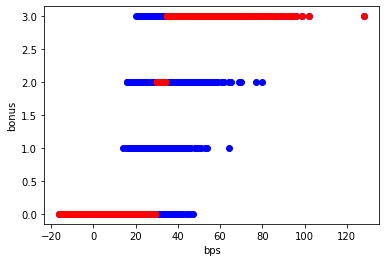

In [60]:
plt.scatter(all_data['bps'], all_data['bonus'], c='blue')
plt.scatter(X, y_pred, c='red')
plt.xlabel('bps')
plt.ylabel('bonus')
plt.show()

In [61]:
y_pred_prob = clf.predict_proba(X)
y_pred_prob

array([[9.99877921e-01, 1.17746525e-04, 4.13133327e-06, 2.00973920e-07],
       [8.94065597e-01, 7.10629628e-02, 2.68367569e-02, 8.03468363e-03],
       [9.87873606e-01, 1.00350777e-02, 1.78949390e-03, 3.01822286e-04],
       ...,
       [9.97120144e-01, 2.56998428e-03, 2.77899942e-04, 3.19716042e-05],
       [9.99877921e-01, 1.17746525e-04, 4.13133327e-06, 2.00973920e-07],
       [9.99755119e-01, 2.33729186e-04, 1.05312719e-05, 6.20301530e-07]])

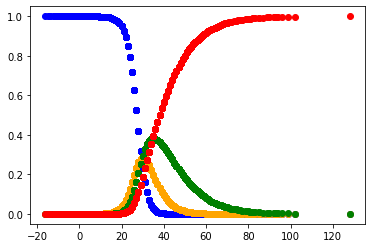

In [62]:
plt.scatter(X,y_pred_prob[:,0],c='blue')
plt.scatter(X,y_pred_prob[:,1],c='orange')
plt.scatter(X,y_pred_prob[:,2],c='green')
plt.scatter(X,y_pred_prob[:,3],c='red')

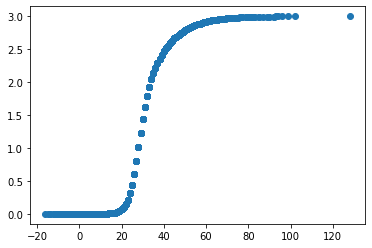

In [63]:
expected_bonus_points = np.matmul(y_pred_prob, np.array([0,1,2,3]).reshape((4,1)))
plt.scatter(X,expected_bonus_points)

In [64]:
# save model 

model_path = f"../../models/logistic_regression_for_bonus_points.pkl"
with open(model_path, "wb") as f:
    # save the model
    pickle.dump(clf, f)

In [65]:
ix=21
clean_sheet_points = np.array([4,4,1,0])
goal_points = np.array([6,6,5,4])

# calculate expexted points
points_played = np.array([1 if all_data.loc[ix,'minutes']>0 else 0])
points_played_over_60 = np.array([1 if all_data.loc[ix,'minutes']>=60 else 0])
points_xG = np.matmul(all_data.loc[ix,fpl_positions_ordered].values, goal_points) * all_data.loc[ix,'Expected_xG']
points_xA = all_data.loc[ix,'Expected_xA'] * 3
clean_sheet_probability = np.array(poisson.pmf(0,all_data.loc[ix,'team_xGA']))
points_clean_sheet = [np.matmul(all_data.loc[ix,fpl_positions_ordered].values, clean_sheet_points)\
                        * clean_sheet_probability if all_data.loc[ix,'minutes']>=60 else 0]
#points_saves = np.matmul(all_data.loc[ix,fpl_positions_ordered].values, save_points) * (all_data.loc[ix,'saves'] // 3)
points_saves = all_data.loc[ix,'saves'] // 3
points_penalty_saves = all_data.loc[ix,'penalties_saved'] * 5 * 0.21 #points for save times approx. probability of penalty save
penalty_for_potential_penalty_miss = all_data.loc[ix,'Performance_PKatt'] * (-2*0.21)
# estimate bonus points
y_pred_prob = clf.predict_proba(all_data.loc[ix, 'bps'].reshape(-1, 1))
points_bonus = np.matmul(y_pred_prob, np.array([0,1,2,3]).reshape((4,1)))

# penalty for possible points deductions based on goals conceded
xGA = all_data.loc[ix,'team_xGA']
# calculate penalty
xGA_conceded_penalty = -(poisson.pmf(2,xGA)+poisson.pmf(3,xGA))-(poisson.pmf(4,xGA)+poisson.pmf(5,xGA))-(poisson.pmf(6,xGA)+poisson.pmf(7,xGA))-(poisson.pmf(8,xGA)+poisson.pmf(9,xGA)-(poisson.pmf(10,xGA)+poisson.pmf(11,xGA)))
# apply penalty only to GK and DEF
xGA_conceded_penalty = np.matmul(all_data.loc[ix,fpl_positions_ordered].values, np.array([1,1,0,0])) * xGA_conceded_penalty
# scale penalty with playing time
xGA_conceded_penalty = (all_data.loc[ix,'minutes'] / 90) * xGA_conceded_penalty

penalty_for_cards = [-3 if all_data.loc[ix,'red_cards']==1 else -1 if all_data.loc[ix,'yellow_cards']==1 else 0]
penalty_for_own_goal = -2 * all_data.loc[ix,'own_goals']

# add up all point components
total_points = points_played + points_played_over_60 + points_xG + points_xA + points_clean_sheet + points_saves +\
                points_penalty_saves + penalty_for_potential_penalty_miss + points_bonus + xGA_conceded_penalty +\
                penalty_for_cards + penalty_for_own_goal

print(f'Points for playing: {points_played}')
print(f'Points for playing over 60 minutes: {points_played_over_60}')
print(f'Points for xG: {points_xG}')
print(f'Points for xA: {points_xA}')
print(f'Clean_sheet_xPoints: {points_clean_sheet}')
print(f'Points for saves: {points_saves}')
print(f'Points for penalty saves: {points_penalty_saves}')
print(f'Penalty for potential penalty miss: {penalty_for_potential_penalty_miss}')
print(f'Bonus points: {points_bonus}')
print(f'xGA conceded penalty: {xGA_conceded_penalty}')
print(f'Penalty for cards: {penalty_for_cards}')
print(f'Penalty for own goals: {penalty_for_own_goal}')
print(f'Total xPoints: {total_points}')

Points for playing: [1]
Points for playing over 60 minutes: [1]
Points for xG: 0.0
Points for xA: 0.0
Clean_sheet_xPoints: [2.6812801841425573]
Points for saves: 0
Points for penalty saves: 0.0
Penalty for potential penalty miss: -0.0
Bonus points: [[0.4399205]]
xGA conceded penalty: -0.06155193550993302
Penalty for cards: [0]
Penalty for own goals: 0
Total xPoints: [[5.05964874]]


In [66]:
def calculate_xPoints(x,fpl_positions_ordered,clf):
    
    clean_sheet_points = np.array([4,4,1,0])
    goal_points = np.array([6,6,5,4])

    # calculate expexted points
    points_played = np.array([1 if x['minutes']>0 else 0])
    points_played_over_60 = np.array([1 if x['minutes']>=60 else 0])
    points_xG = np.matmul(x[fpl_positions_ordered].values, goal_points) * x['Expected_xG']
    points_xA = x['Expected_xA'] * 3
    clean_sheet_probability = np.array(poisson.pmf(0,x['team_xGA']))
    points_clean_sheet = [np.matmul(x[fpl_positions_ordered].values, clean_sheet_points) *\
                          clean_sheet_probability if x['minutes']>=60 else 0]
    points_saves = x['saves'] // 3
    points_penalty_saves = x['penalties_saved'] * 5 * 0.21 #points for save times approx. probability of penalty save
    penalty_for_potential_penalty_miss = x['Performance_PKatt'] * (-2*0.21)
    # estimate bonus points
    y_pred_prob = clf.predict_proba(np.array(x['bps']).reshape(-1, 1))
    points_bonus = np.matmul(y_pred_prob, np.array([0,1,2,3]).reshape((4,1)))

    # penalty for possible points deductions based on goals conceded
    xGA = x['team_xGA']
    # calculate penalty
    xGA_conceded_penalty = -(poisson.pmf(2,xGA)+poisson.pmf(3,xGA))-(poisson.pmf(4,xGA)+poisson.pmf(5,xGA))-(poisson.pmf(6,xGA)+poisson.pmf(7,xGA))-(poisson.pmf(8,xGA)+poisson.pmf(9,xGA)-(poisson.pmf(10,xGA)+poisson.pmf(11,xGA)))
    # apply penalty only to GK and DEF
    xGA_conceded_penalty = np.matmul(x[fpl_positions_ordered].values, np.array([1,1,0,0])) * xGA_conceded_penalty
    # scale penalty with playing time
    xGA_conceded_penalty = (x['minutes'] / 90) * xGA_conceded_penalty

    penalty_for_cards = [-3 if x['red_cards']==1 else -1 if x['yellow_cards']==1 else 0]
    penalty_for_own_goal = -2 * x['own_goals']

    # add up all point components
    total_points = float(points_played + points_played_over_60 + points_xG + points_xA + points_clean_sheet + points_saves +\
                    points_penalty_saves + penalty_for_potential_penalty_miss + points_bonus + xGA_conceded_penalty +\
                    penalty_for_cards + penalty_for_own_goal)
    
    return total_points

In [67]:
all_data['xPoints'] = all_data.apply(lambda x: calculate_xPoints(x,fpl_positions_ordered,clf), axis=1)
all_data['xPoints']

0        0.938102
1        3.381712
2        3.014520
3        8.066695
4        5.890018
           ...   
41112    1.589526
41113    1.736843
41114    2.371101
41115    0.995591
41116    2.100515
Name: xPoints, Length: 41117, dtype: float64

### Change player values to correct units

In [68]:
# change player values to correct units
all_data['value'] = all_data['value']/10.0
all_data['value']

0         5.0
1         5.5
2         7.0
3         5.0
4        10.5
         ... 
41112     4.3
41113     4.5
41114     4.9
41115     4.9
41116     5.9
Name: value, Length: 41117, dtype: float64

## Exponentially weighted variables

In [69]:
ewa_intervals = [5,10,20,40]
games_in_the_past = [5,10,20,40]
# new column_names that will be added 
keep = []
for i in games_in_the_past:
    keep.append(f'games_in_past_{i}_days')
keep.append('transfers_balance_%')
keep.append('transfers_balance_%_ewa5')
keep.append('transfers_balance_%_ewa10')
for i in [1,2,5]:
    keep.append(f'value_change_{i}')

columns_for_difference = ['selected', 'transfers_balance', 'value']

columns_for_ewa = ['total_points', 'xPoints', 'assists', 'bonus', 'bps', 'clean_sheets', 'creativity', 
                   'goals_conceded', 'goals_scored', 'ict_index', 'influence', 'minutes', 'own_goals', 'penalties_missed',
                   'penalties_saved', 'saves', 'threat', 'yellow_cards', 
                'Performance_Sh', 'Performance_SoT', 'Performance_Touches', 'Performance_Press', 'Performance_Tkl',
                  'Performance_Int', 'Performance_Blocks', 'Expected_xG', 'Expected_npxG', 'Expected_xA',
                  'SCA_SCA', 'Passes_Cmp', 'Passes_Cmp%', 'Passes_Prog', 'Carries_Carries', 'Carries_Prog',
                  'Dribbles_Succ', 'Dribbles_Att', 'General_KP', 'Touches_Att 3rd', 'Touches_Att Pen', 
                   'Performance_Recov', 'Aerial Duels_Won', 'Aerial Duels_Won%']

for i in ewa_intervals:
    new_columns = [col+f'_ewa_{i}' for col in columns_for_ewa]
    keep.extend(new_columns)
    
player_names = all_data['name'].unique()
new_all_data = pd.DataFrame()

for player_name in player_names:
    # find all entries for given player
    data = all_data[(all_data['name']==player_name)].sort_values(by='kickoff_time').copy()

    # info on number of games played recently
    for i in games_in_the_past:
        aux_list = []
        for ix in data.index:
            game_time = data.loc[ix, 'kickoff_time'] 
            aux_list.append(data[(data['kickoff_time']>=game_time-dt.timedelta(days=i)) &\
                                                           (data['kickoff_time']<game_time)].shape[0])
        data[f'games_in_past_{i}_days'] = aux_list

    # change in fpl ownership and value
    # shift values down one row (info known from previous game weeks before a new game)
    data[columns_for_difference] = data[columns_for_difference].shift(1)
    # change in fpl ownership 
    data['transfers_balance_%'] = data['transfers_balance'] / data['selected']
    data['transfers_balance_%_ewa5'] = data['transfers_balance_%'].ewm(alpha=1/5).mean()
    data['transfers_balance_%_ewa10'] = data['transfers_balance_%'].ewm(alpha=1/10).mean()
    # change in fpl value
    for i in [1,2,5]:
        data[f'value_change_{i}'] = data['value'].diff(i)
    
    # drop rows for games where the player did not play so these are not included when counting exponentially 
    # weighted averages
    data = data[data['minutes']>0]
    # calculate exponential weighted average for a number of statistics and shift down 1 row 
    # (so that this is the info known when trying to predict total_points of the row)
    data['goal_to_xg_ratio_ewa_40'] = (data['goals_scored'] / data['Expected_xG']).ewm(alpha=1/40).mean().shift(1)
    for i in ewa_intervals:
        new_data = data[columns_for_ewa].ewm(alpha=1/i).mean().shift(1)
        new_columns = [col+f'_ewa_{i}' for col in columns_for_ewa]
        new_data.columns = new_columns
        data = pd.concat([data, new_data], axis=1)

    # only keep the desired columns
    #data = data[keep]
    # add given player's data to the dataframe for all players
    new_all_data = pd.concat([new_all_data,data], axis=0)

display(new_all_data)

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_GK,fbref_position_LB,fbref_position_CB,fbref_position_RB,fbref_position_WB,fbref_position_DM,fbref_position_LM,fbref_position_CM,fbref_position_RM,fbref_position_AM,fbref_position_LW,fbref_position_RW,fbref_position_FW,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted,opp_team_xG,opp_team_xGA,opp_team_xG_ewa_5_shifted,opp_team_xG_ewa_10_shifted,opp_team_xG_ewa_20_shifted,opp_team_xG_ewa_40_shifted,opp_team_xGA_ewa_5_shifted,opp_team_xGA_ewa_10_shifted,opp_team_xGA_ewa_20_shifted,opp_team_xGA_ewa_40_shifted,xPoints,games_in_past_5_days,games_in_past_10_days,games_in_past_20_days,games_in_past_40_days,transfers_balance_%,transfers_balance_%_ewa5,transfers_balance_%_ewa10,value_change_1,value_change_2,value_change_5,goal_to_xg_ratio_ewa_40,total_points_ewa_5,xPoints_ewa_5,assists_ewa_5,bonus_ewa_5,bps_ewa_5,clean_sheets_ewa_5,creativity_ewa_5,goals_conceded_ewa_5,goals_scored_ewa_5,ict_index_ewa_5,influence_ewa_5,minutes_ewa_5,own_goals_ewa_5,penalties_missed_ewa_5,penalties_saved_ewa_5,saves_ewa_5,threat_ewa_5,yellow_cards_ewa_5,Performance_Sh_ewa_5,Performance_SoT_ewa_5,Performance_Touches_ewa_5,Performance_Press_ewa_5,Performance_Tkl_ewa_5,Performance_Int_ewa_5,Performance_Blocks_ewa_5,Expected_xG_ewa_5,Expected_npxG_ewa_5,Expected_xA_ewa_5,SCA_SCA_ewa_5,Passes_Cmp_ewa_5,Passes_Cmp%_ewa_5,Passes_Prog_ewa_5,Carries_Carries_ewa_5,Carries_Prog_ewa_5,Dribbles_Succ_ewa_5,Dribbles_Att_ewa_5,General_KP_ewa_5,Touches_Att 3rd_ewa_5,Touches_Att Pen_ewa_5,Performance_Recov_ewa_5,Aerial 

In [70]:
len(set(all_data.index).difference(set(new_all_data.index)))

106

In [71]:
set(all_data.index).difference(set(new_all_data.index))

{92,
 101,
 598,
 755,
 778,
 1367,
 1407,
 1414,
 1422,
 1581,
 1585,
 1688,
 1716,
 1904,
 1976,
 2120,
 2202,
 2676,
 2703,
 2779,
 2848,
 3336,
 3879,
 4974,
 5026,
 5049,
 6091,
 6092,
 6175,
 6365,
 6462,
 6653,
 6742,
 6842,
 7029,
 7220,
 7221,
 7413,
 7414,
 7505,
 7686,
 8047,
 8330,
 8699,
 10981,
 13353,
 13498,
 13649,
 13823,
 14116,
 14423,
 14655,
 14898,
 15124,
 15340,
 15664,
 15726,
 15819,
 15823,
 15903,
 15968,
 16192,
 16288,
 16429,
 16597,
 16854,
 16922,
 17032,
 17444,
 17459,
 17698,
 17846,
 17850,
 17913,
 18331,
 18375,
 18581,
 19659,
 19668,
 19672,
 19676,
 19680,
 19687,
 19696,
 19705,
 19710,
 19721,
 19731,
 19736,
 19745,
 19759,
 19771,
 19775,
 19790,
 19808,
 19814,
 19820,
 19830,
 19834,
 19850,
 19860,
 19896,
 19899,
 19919,
 31298,
 39053}

In [72]:
all_data.loc[92:92]

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_GK,fbref_position_LB,fbref_position_CB,fbref_position_RB,fbref_position_WB,fbref_position_DM,fbref_position_LM,fbref_position_CM,fbref_position_RM,fbref_position_AM,fbref_position_LW,fbref_position_RW,fbref_position_FW,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted,opp_team_xG,opp_team_xGA,opp_team_xG_ewa_5_shifted,opp_team_xG_ewa_10_shifted,opp_team_xG_ewa_20_shifted,opp_team_xG_ewa_40_shifted,opp_team_xGA_ewa_5_shifted,opp_team_xGA_ewa_10_shifted,opp_team_xGA_ewa_20_shifted,opp_team_xGA_ewa_40_shifted,xPoints
92,2017-18,Kieran Gibbs,DEF,0,0,0,0,0.0,8,1,0,0,0.0,0.0,2017-08-11 18:45:00+00:00,0,9,Leicester City,0,0,0,0,1,0,6359,3.0,4.0,0.0,0,0,0,0,5.0,1,0,1,3.0,eng ENG,LB,28-165,90.0,0,0,0,0,0,0,0,0,48.0,3.0,1.0,0,0.0,0.0,0.0,0.0,0.0,0.0,28.0,42.0,66.7,4.0,22.0,6.0,0.0,0.0,West Brom,28.0,42.0,66.7,558.0,309.0,10.0,10.0,100.0,13.0,23.0,56.5,4.0,8.0,50.0,0,0.0,0.0,5.0,0.0,0.0,4.0,42.0,33.0,9.0,0.0,0.0,2.0,0.0,2,0.0,0.0,0.0,0.0,15.0,5.0,22.0,25.0,4.0,3.0,9.0,0.0,28.0,1.0,1.0,3.0,0.0,1.0,1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,3.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0,1.0,3.0,0.0,48.0,4.0,20.0,18.0,14.0,1.0,39.0,NaN,0.0,0.0,154.0,104.0,2.0,1.0,0.0,1.0,28.0,27.0,96.4,2.0,0,0,1,0,2,1,0.0,0.0,0,8.0,1.0,1.0,50.0,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1.2,0.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000044


Seems like there's some issues with the fpl data missing but only a little and we can drop these data...

In [73]:
all_data_backup = all_data.copy()
all_data = new_all_data.copy()

In [74]:
all_data

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_GK,fbref_position_LB,fbref_position_CB,fbref_position_RB,fbref_position_WB,fbref_position_DM,fbref_position_LM,fbref_position_CM,fbref_position_RM,fbref_position_AM,fbref_position_LW,fbref_position_RW,fbref_position_FW,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted,opp_team_xG,opp_team_xGA,opp_team_xG_ewa_5_shifted,opp_team_xG_ewa_10_shifted,opp_team_xG_ewa_20_shifted,opp_team_xG_ewa_40_shifted,opp_team_xGA_ewa_5_shifted,opp_team_xGA_ewa_10_shifted,opp_team_xGA_ewa_20_shifted,opp_team_xGA_ewa_40_shifted,xPoints,games_in_past_5_days,games_in_past_10_days,games_in_past_20_days,games_in_past_40_days,transfers_balance_%,transfers_balance_%_ewa5,transfers_balance_%_ewa10,value_change_1,value_change_2,value_change_5,goal_to_xg_ratio_ewa_40,total_points_ewa_5,xPoints_ewa_5,assists_ewa_5,bonus_ewa_5,bps_ewa_5,clean_sheets_ewa_5,creativity_ewa_5,goals_conceded_ewa_5,goals_scored_ewa_5,ict_index_ewa_5,influence_ewa_5,minutes_ewa_5,own_goals_ewa_5,penalties_missed_ewa_5,penalties_saved_ewa_5,saves_ewa_5,threat_ewa_5,yellow_cards_ewa_5,Performance_Sh_ewa_5,Performance_SoT_ewa_5,Performance_Touches_ewa_5,Performance_Press_ewa_5,Performance_Tkl_ewa_5,Performance_Int_ewa_5,Performance_Blocks_ewa_5,Expected_xG_ewa_5,Expected_npxG_ewa_5,Expected_xA_ewa_5,SCA_SCA_ewa_5,Passes_Cmp_ewa_5,Passes_Cmp%_ewa_5,Passes_Prog_ewa_5,Carries_Carries_ewa_5,Carries_Prog_ewa_5,Dribbles_Succ_ewa_5,Dribbles_Att_ewa_5,General_KP_ewa_5,Touches_Att 3rd_ewa_5,Touches_Att Pen_ewa_5,Performance_Recov_ewa_5,Aerial 

Let's calculate ewa for fbref position data

In [75]:
# calculate weighted averages of fbref positions for each player and add to all_data
new_column_data = pd.DataFrame()
new_columns_5 = [col+'_ewa5' for col in fbref_position_columns_ordered]
new_columns_10 = [col+'_ewa10' for col in fbref_position_columns_ordered]
new_columns_20 = [col+'_ewa20' for col in fbref_position_columns_ordered]
new_columns_40 = [col+'_ewa40' for col in fbref_position_columns_ordered]
for player_name in player_names:
    aux = all_data[(all_data['name']==player_name)].copy()
    aux[new_columns_5] = aux[fbref_position_columns_ordered].ewm(alpha=1/5).mean().shift(1)
    aux[new_columns_10] = aux[fbref_position_columns_ordered].ewm(alpha=1/10).mean().shift(1)
    aux[new_columns_20] = aux[fbref_position_columns_ordered].ewm(alpha=1/20).mean().shift(1)
    aux[new_columns_40] = aux[fbref_position_columns_ordered].ewm(alpha=1/40).mean().shift(1)
    aux = pd.concat([aux[new_columns_5],aux[new_columns_10],aux[new_columns_20],aux[new_columns_40]], axis=1)
    new_column_data = pd.concat([new_column_data, aux], axis=0)

# add data to all_data
all_data = pd.concat([all_data,new_column_data], axis=1)
display(all_data)

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_GK,fbref_position_LB,fbref_position_CB,fbref_position_RB,fbref_position_WB,fbref_position_DM,fbref_position_LM,fbref_position_CM,fbref_position_RM,fbref_position_AM,fbref_position_LW,fbref_position_RW,fbref_position_FW,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted,opp_team_xG,opp_team_xGA,opp_team_xG_ewa_5_shifted,opp_team_xG_ewa_10_shifted,opp_team_xG_ewa_20_shifted,opp_team_xG_ewa_40_shifted,opp_team_xGA_ewa_5_shifted,opp_team_xGA_ewa_10_shifted,opp_team_xGA_ewa_20_shifted,opp_team_xGA_ewa_40_shifted,xPoints,games_in_past_5_days,games_in_past_10_days,games_in_past_20_days,games_in_past_40_days,transfers_balance_%,transfers_balance_%_ewa5,transfers_balance_%_ewa10,value_change_1,value_change_2,value_change_5,goal_to_xg_ratio_ewa_40,total_points_ewa_5,xPoints_ewa_5,assists_ewa_5,bonus_ewa_5,bps_ewa_5,clean_sheets_ewa_5,creativity_ewa_5,goals_conceded_ewa_5,goals_scored_ewa_5,ict_index_ewa_5,influence_ewa_5,minutes_ewa_5,own_goals_ewa_5,penalties_missed_ewa_5,penalties_saved_ewa_5,saves_ewa_5,threat_ewa_5,yellow_cards_ewa_5,Performance_Sh_ewa_5,Performance_SoT_ewa_5,Performance_Touches_ewa_5,Performance_Press_ewa_5,Performance_Tkl_ewa_5,Performance_Int_ewa_5,Performance_Blocks_ewa_5,Expected_xG_ewa_5,Expected_npxG_ewa_5,Expected_xA_ewa_5,SCA_SCA_ewa_5,Passes_Cmp_ewa_5,Passes_Cmp%_ewa_5,Passes_Prog_ewa_5,Carries_Carries_ewa_5,Carries_Prog_ewa_5,Dribbles_Succ_ewa_5,Dribbles_Att_ewa_5,General_KP_ewa_5,Touches_Att 3rd_ewa_5,Touches_Att Pen_ewa_5,Performance_Recov_ewa_5,Aerial 

## Add one-hot-encoded variables tagging special/important players

In [76]:
vip_players = []
player_names = all_data['name'].unique()
for player_name in player_names:
    aux = all_data[(all_data['name']==player_name)].copy()
    #if (aux['total_points'].mean()>5) & (aux.shape[0]>=20):
    if (aux['total_points'].mean() - (aux['xPoints'].mean()) >= 0.4) & \
        (aux['xPoints'].mean()>4) & (aux.shape[0]>=20):
        vip_players.append(player_name)
display(vip_players)

['Harry Kane',
 'Heung-Min Son',
 'Jamie Vardy',
 'Kevin De Bruyne',
 'Mohamed Salah',
 'Riyad Mahrez',
 'Sergio Aguero',
 'Bruno Miguel Borges Fernandes']

In [77]:
vip_players = [
    'Harry Kane',
    'Heung-Min Son',
    'Jamie Vardy',
    'Kevin De Bruyne',
    'Mohamed Salah',
    'Riyad Mahrez',
    'Bruno Miguel Borges Fernandes'
]

vip_columns = [
    'is_harry_kane',
    'is_heung_min_son',
    'is_jamie_vardy',
    'is_kevin_de_bruyne',
    'is_mohamed_salah',
    'is_riyad_mahrez',
    'is_bruno_fernandes'
]

In [78]:
display(len(vip_players))
display(len(vip_columns))

7

7

In [79]:
for i in range(0,7):
    # initialize with zeros
    all_data[vip_columns[i]] = 0
    # fill 1 for the correct player
    all_data.loc[all_data['name']==vip_players[i], vip_columns[i]] = 1

In [80]:
all_data

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_GK,fbref_position_LB,fbref_position_CB,fbref_position_RB,fbref_position_WB,fbref_position_DM,fbref_position_LM,fbref_position_CM,fbref_position_RM,fbref_position_AM,fbref_position_LW,fbref_position_RW,fbref_position_FW,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted,opp_team_xG,opp_team_xGA,opp_team_xG_ewa_5_shifted,opp_team_xG_ewa_10_shifted,opp_team_xG_ewa_20_shifted,opp_team_xG_ewa_40_shifted,opp_team_xGA_ewa_5_shifted,opp_team_xGA_ewa_10_shifted,opp_team_xGA_ewa_20_shifted,opp_team_xGA_ewa_40_shifted,xPoints,games_in_past_5_days,games_in_past_10_days,games_in_past_20_days,games_in_past_40_days,transfers_balance_%,transfers_balance_%_ewa5,transfers_balance_%_ewa10,value_change_1,value_change_2,value_change_5,goal_to_xg_ratio_ewa_40,total_points_ewa_5,xPoints_ewa_5,assists_ewa_5,bonus_ewa_5,bps_ewa_5,clean_sheets_ewa_5,creativity_ewa_5,goals_conceded_ewa_5,goals_scored_ewa_5,ict_index_ewa_5,influence_ewa_5,minutes_ewa_5,own_goals_ewa_5,penalties_missed_ewa_5,penalties_saved_ewa_5,saves_ewa_5,threat_ewa_5,yellow_cards_ewa_5,Performance_Sh_ewa_5,Performance_SoT_ewa_5,Performance_Touches_ewa_5,Performance_Press_ewa_5,Performance_Tkl_ewa_5,Performance_Int_ewa_5,Performance_Blocks_ewa_5,Expected_xG_ewa_5,Expected_npxG_ewa_5,Expected_xA_ewa_5,SCA_SCA_ewa_5,Passes_Cmp_ewa_5,Passes_Cmp%_ewa_5,Passes_Prog_ewa_5,Carries_Carries_ewa_5,Carries_Prog_ewa_5,Dribbles_Succ_ewa_5,Dribbles_Att_ewa_5,General_KP_ewa_5,Touches_Att 3rd_ewa_5,Touches_Att Pen_ewa_5,Performance_Recov_ewa_5,Aerial 

In [81]:
all_data[all_data['is_harry_kane']==1]

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_GK,fbref_position_LB,fbref_position_CB,fbref_position_RB,fbref_position_WB,fbref_position_DM,fbref_position_LM,fbref_position_CM,fbref_position_RM,fbref_position_AM,fbref_position_LW,fbref_position_RW,fbref_position_FW,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted,opp_team_xG,opp_team_xGA,opp_team_xG_ewa_5_shifted,opp_team_xG_ewa_10_shifted,opp_team_xG_ewa_20_shifted,opp_team_xG_ewa_40_shifted,opp_team_xGA_ewa_5_shifted,opp_team_xGA_ewa_10_shifted,opp_team_xGA_ewa_20_shifted,opp_team_xGA_ewa_40_shifted,xPoints,games_in_past_5_days,games_in_past_10_days,games_in_past_20_days,games_in_past_40_days,transfers_balance_%,transfers_balance_%_ewa5,transfers_balance_%_ewa10,value_change_1,value_change_2,value_change_5,goal_to_xg_ratio_ewa_40,total_points_ewa_5,xPoints_ewa_5,assists_ewa_5,bonus_ewa_5,bps_ewa_5,clean_sheets_ewa_5,creativity_ewa_5,goals_conceded_ewa_5,goals_scored_ewa_5,ict_index_ewa_5,influence_ewa_5,minutes_ewa_5,own_goals_ewa_5,penalties_missed_ewa_5,penalties_saved_ewa_5,saves_ewa_5,threat_ewa_5,yellow_cards_ewa_5,Performance_Sh_ewa_5,Performance_SoT_ewa_5,Performance_Touches_ewa_5,Performance_Press_ewa_5,Performance_Tkl_ewa_5,Performance_Int_ewa_5,Performance_Blocks_ewa_5,Expected_xG_ewa_5,Expected_npxG_ewa_5,Expected_xA_ewa_5,SCA_SCA_ewa_5,Passes_Cmp_ewa_5,Passes_Cmp%_ewa_5,Passes_Prog_ewa_5,Carries_Carries_ewa_5,Carries_Prog_ewa_5,Dribbles_Succ_ewa_5,Dribbles_Att_ewa_5,General_KP_ewa_5,Touches_Att 3rd_ewa_5,Touches_Att Pen_ewa_5,Performance_Recov_ewa_5,Aerial 

In [88]:
# change tackles to 0 for goalkeepers (very rare, but some have positive values)
all_data.loc[(all_data['fpl_position_GK']==1), 'Performance_Tkl_ewa_5'] = 0
all_data.loc[(all_data['fpl_position_GK']==1), 'Performance_Tkl_ewa_10'] = 0
all_data.loc[(all_data['fpl_position_GK']==1), 'Performance_Tkl_ewa_20'] = 0
all_data.loc[(all_data['fpl_position_GK']==1), 'Performance_Tkl_ewa_40'] = 0

,season,name,position,assists,bonus,bps,clean_sheets,creativity,element,fixture,goals_conceded,goals_scored,ict_index,influence,kickoff_time,minutes,opponent_team,opp_team_name,own_goals,penalties_missed,penalties_saved,red_cards,round,saves,selected,team_a_score,team_h_score,threat,total_points,transfers_balance,transfers_in,transfers_out,value,was_home,yellow_cards,GW,General_#,General_Nation,General_Pos,General_Age,General_Min,Performance_Gls,Performance_Ast,Performance_PK,Performance_PKatt,Performance_Sh,Performance_SoT,Performance_CrdY,Performance_CrdR,Performance_Touches,Performance_Press,Performance_Tkl,Performance_Int,Performance_Blocks,Expected_xG,Expected_npxG,Expected_xA,SCA_SCA,SCA_GCA,Passes_Cmp,Passes_Att,Passes_Cmp%,Passes_Prog,Carries_Carries,Carries_Prog,Dribbles_Succ,Dribbles_Att,team,Total_Cmp,Total_Att,Total_Cmp%,Total_TotDist,Total_PrgDist,Short_Cmp,Short_Att,Short_Cmp%,Medium_Cmp,Medium_Att,Medium_Cmp%,Long_Cmp,Long_Att,Long_Cmp%,General_Ast,General_xA,General_KP,General_1/3,General_PPA,General_CrsPA,General_Prog,General_Att,Pass Types_Live,Pass Types_Dead,Pass Types_FK,Pass Types_TB,Pass Types_Press,Pass Types_Sw,Pass Types_Crs,Pass Types_CK,Corner Kicks_In,Corner Kicks_Out,Corner Kicks_Str,Height_Ground,Height_Low,Height_High,Body Parts_Left,Body Parts_Right,Body Parts_Head,Body Parts_TI,Body Parts_Other,Outcomes_Cmp,Outcomes_Off,Outcomes_Out,Outcomes_Int,Outcomes_Blocks,Tackles_Tkl,Tackles_TklW,Tackles_Def 3rd,Tackles_Mid 3rd,Tackles_Att 3rd,Vs Dribbles_Tkl,Vs Dribbles_Att,Vs Dribbles_Tkl%,Vs Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def 3rd,Pressures_Mid 3rd,Pressures_Att 3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,General_Int,General_Tkl+Int,General_Clr,General_Err,Touches_Touches,Touches_Def Pen,Touches_Def 3rd,Touches_Mid 3rd,Touches_Att 3rd,Touches_Att Pen,Touches_Live,Dribbles_Succ%,Dribbles_#Pl,Dribbles_Megs,Carries_TotDist,Carries_PrgDist,Carries_1/3,Carries_CPA,Carries_Mis,Carries_Dis,Receiving_Targ,Receiving_Rec,Receiving_Rec%,Receiving_Prog,Performance_2CrdY,Performance_Fls,Performance_Fld,Performance_Off,Performance_Crs,Performance_TklW,Performance_PKwon,Performance_PKcon,Performance_OG,Performance_Recov,Aerial Duels_Won,Aerial Duels_Lost,Aerial Duels_Won%,fpl_position_GK,fpl_position_DEF,fpl_position_MID,fpl_position_FWD,fbref_position_GK,fbref_position_LB,fbref_position_CB,fbref_position_RB,fbref_position_WB,fbref_position_DM,fbref_position_LM,fbref_position_CM,fbref_position_RM,fbref_position_AM,fbref_position_LW,fbref_position_RW,fbref_position_FW,team_xG,team_xGA,team_xG_ewa_5_shifted,team_xG_ewa_10_shifted,team_xG_ewa_20_shifted,team_xG_ewa_40_shifted,team_xGA_ewa_5_shifted,team_xGA_ewa_10_shifted,team_xGA_ewa_20_shifted,team_xGA_ewa_40_shifted,opp_team_xG,opp_team_xGA,opp_team_xG_ewa_5_shifted,opp_team_xG_ewa_10_shifted,opp_team_xG_ewa_20_shifted,opp_team_xG_ewa_40_shifted,opp_team_xGA_ewa_5_shifted,opp_team_xGA_ewa_10_shifted,opp_team_xGA_ewa_20_shifted,opp_team_xGA_ewa_40_shifted,xPoints,games_in_past_5_days,games_in_past_10_days,games_in_past_20_days,games_in_past_40_days,transfers_balance_%,transfers_balance_%_ewa5,transfers_balance_%_ewa10,value_change_1,value_change_2,value_change_5,goal_to_xg_ratio_ewa_40,total_points_ewa_5,xPoints_ewa_5,assists_ewa_5,bonus_ewa_5,bps_ewa_5,clean_sheets_ewa_5,creativity_ewa_5,goals_conceded_ewa_5,goals_scored_ewa_5,ict_index_ewa_5,influence_ewa_5,minutes_ewa_5,own_goals_ewa_5,penalties_missed_ewa_5,penalties_saved_ewa_5,saves_ewa_5,threat_ewa_5,yellow_cards_ewa_5,Performance_Sh_ewa_5,Performance_SoT_ewa_5,Performance_Touches_ewa_5,Performance_Press_ewa_5,Performance_Tkl_ewa_5,Performance_Int_ewa_5,Performance_Blocks_ewa_5,Expected_xG_ewa_5,Expected_npxG_ewa_5,Expected_xA_ewa_5,SCA_SCA_ewa_5,Passes_Cmp_ewa_5,Passes_Cmp%_ewa_5,Passes_Prog_ewa_5,Carries_Carries_ewa_5,Carries_Prog_ewa_5,Dribbles_Succ_ewa_5,Dribbles_Att_ewa_5,General_KP_ewa_5,Touches_Att 3rd_ewa_5,Touches_Att Pen_ewa_5,Performance_Recov_ewa_5,Aerial 

In [82]:
all_data.to_csv('../../data/data_for_modelling.csv')